# 🏪🛒🏷️⬇️STORE SALES FORECASTING💰💲📊📈💸
This is a part of KAGGLE's **“Getting Started”** competition, that requires using time-series forecasting to forecast store sales on data from Corporación Favorita, a large Ecuadorian-based grocery retailer.


Specifically, it requires building a model that more accurately predicts the unit sales for thousands of items sold at different Favorita stores. It is a hands on practice to improve one's machine learning skills with an approachable training dataset of dates, store, and item information, promotions, and unit sale.


Forecasts aren’t just for meteorologists. Governments forecast economic growth. Scientists attempt to predict the future population. And businesses forecast product demand—a common task of professional data scientists. Forecasts are especially relevant to brick-and-mortar grocery stores, which must dance delicately with how much inventory to buy. Predict a little over, and grocers are stuck with overstocked, perishable goods. Guess a little under, and popular items quickly sell out, leading to lost revenue and upset customers. More accurate forecasting, thanks to machine learning, could help ensure retailers please customers by having just enough of the right products at the right time.

Current subjective forecasting methods for retail have little data to back them up and are unlikely to be automated. The problem becomes even more complex as retailers add new locations with unique needs, new products, ever-transitioning seasonal tastes, and unpredictable product marketin

If successful, it helps gain a new skill set built with a real world example. For grocery stores, more accurate forecasting can decrease food waste related to overstocking and improve customer satisfaction. The results of this ongoing competition, over time, might even ensure your local store has exactly what you need the next time you shop.

## PROBLEM DEFINITION
> How well can we predict sales for the thousands of product families sold at Favorita stores located in Ecuador?

## DATA

The training data includes dates, store and product information, whether that item was being promoted, as well as the sales numbers. Additional files include supplementary information that may be useful in building your models:
* The **training data**, comprising time series of features store_nbr, family, and onpromotion as well as the target sales.

* **store_nbr** identifies the store at which the products are sold.
  
* **family** identifies the type of product sold.

* **sales** gives the total sales for a product family at a particular store at a given date. Fractional values are possible since products can be sold in fractional units (1.5 kg of cheese, for instance, as opposed to 1 bag of chips).

* **onpromotion** gives the total number of items in a product family that were being promoted at a store at a given date.

* The **test data**, having the same features as the training data. You will predict the target sales for the dates in this file. The dates in the test data are for the 15 days after the last date in the training data.

* **stores.csv** contains:  
    * Store metadata, including city, state, type, and cluster.
    * cluster is a grouping of similar stores

* **holidays_events.csv** contains: 
    * Holidays and Events, with metadata
    * NOTE: Pay special attention to the transferred column. A holiday that is transferred officially falls on that calendar day, but was moved to another date by the government. A transferred day is more like a normal day than a holiday. To find the day that it was actually celebrated, look for the corresponding row where type is Transfer. For example, the holiday Independencia de Guayaquil was transferred from 2012-10-09 to 2012-10-12, which means it was celebrated on 2012-10-12. Days that are type Bridge are extra days that are added to a holiday (e.g., to extend the break across a long weekend). These are frequently made up by the type Work Day which is a day not normally scheduled for work (e.g., Saturday) that is meant to payback the Bridge.
    * Additional holidays are days added a regular calendar holiday, for example, as typically happens around Christmas (making Christmas Eve a holiday).

**ADDITIONAL NOTES**
* Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month. Supermarket sales could be affected by this.
* A magnitude 7.8 earthquake struck Ecuador on April 16, 2016. People rallied in relief efforts donating water and other first need products which greatly affected supermarket sales for several weeks after the earthquake.

The data is from Kaggle's Getting started with Time Series competition, Store-Sales: https://www.kaggle.com/competitions/store-sales-time-series-forecasting/data

## EVALUATION

**Metric**
The evaluation metric for this competition is Root Mean Squared Logarithmic Error. For more information on the evaluation of this project check: https://www.kaggle.com/competitions/store-sales-time-series-forecasting

**NOTE:** The goal for most regression evaluation metrics is to minimize the error. For example, our goal for this project will be to build a machine learning model which minimizes RMSLE.

## IMPORT STATEMENT

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import xgboost as xg
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from statsmodels.graphics.tsaplots import plot_pacf, seasonal_plot
from scipy.signal import periodogram
from itertools import product

In [2]:
# Display all the columns in the dataset
pd.pandas.set_option('display.max_columns', None)

# Display all the rows in the dataset
# pd.pandas.set_option('display.max_rows', None)

In [3]:
df = pd.read_csv("train.csv",
                    low_memory = False,
                    dtype = {
                        'store_nbr' : 'category',
                        'family' : 'category',
                        'sales' : 'float32',
                        'onpromotion' : 'uint32',
                    },
                    parse_dates = ['date'],
                   )
df['date'] = df.date.dt.to_period('D')
df = df.set_index(['store_nbr', 'family', 'date']).sort_index()
df

id      sales  onpromotion
store_nbr family     date                                       
1         AUTOMOTIVE 2013-01-01        0   0.000000            0
                     2013-01-02     1782   2.000000            0
                     2013-01-03     3564   3.000000            0
                     2013-01-04     5346   3.000000            0
                     2013-01-05     7128   5.000000            0
...                                  ...        ...          ...
9         SEAFOOD    2017-08-11  2993759  23.830999            0
                     2017-08-12  2995541  16.859001            4
                     2017-08-13  2997323  20.000000            0
                     2017-08-14  2999105  17.000000            0
                     2017-08-15  3000887  16.000000            0

[3000888 rows x 3 columns]

> The train dataset does not have `ROWS` for `Christmas day` and this is important to show the effect of the `holiday` on `sales`. So a dataframe with the Christmas date will be created and filled with `Zero` for sales as these stores were closed on said dates, leading to the `NO AVAILABLE` data for those dates. The dataframe would be merged with our main train dataset and used to train our Model.

In [4]:
# Since christmas is missing from our training set, we will input it into our dataframe.
families = sorted(df.reset_index()["family"].unique())                    # Create a list of all our unique family product names
stores = sorted(df.reset_index()['store_nbr'].unique())                   # Create a list of all our unique store numbers
# christmas = pd.period_range('2013-12-25', '2016-12-25', freq = 'Y').to_list()
years = [2013, 2014, 2015, 2016]                                          
christmas = [f"{year}-12-25" for year in years]                           # Create a list of the dates for christmas for the period of our training set   

# Carry out a vector product on our 3 lists to realise full values of matches for store, product family and date. 
rows = list(product(stores, families, christmas))

# Create dataframe with the vector product to realize the full christmas dates columns and rows
christmas_df = pd.DataFrame(rows, columns =['store_nbr', 'family', 'date'])
# Convert the date to datetime period
christmas_df["date"] = pd.to_datetime(christmas_df["date"]).dt.to_period('D')
christmas_df["sales"] = 0                                                # Input zero into our sales column to show that the stores were closed on said chrismas day
christmas_df["onpromotion"] = np.nan                                     # FIll the onpromotion column with NAN values to be filled by shifting the values from the previoud day
christmas_df["id"] = 350000000                                           # Give it an Arbitrary Value would be dropped during training
christmas_df = christmas_df.astype({
    'store_nbr' : 'category',
    'family': 'category',
    'sales' : 'float32'
})
christmas_df['onpromotion'] = christmas_df['onpromotion'].astype(pd.UInt32Dtype())
christmas_df

,store_nbr,family,date,sales,onpromotion,id
0,1,AUTOMOTIVE,2013-12-25,0.0,<NA>,350000000
1,1,AUTOMOTIVE,2014-12-25,0.0,<NA>,350000000
2,1,AUTOMOTIVE,2015-12-25,0.0,<NA>,350000000
3,1,AUTOMOTIVE,2016-12-25,0.0,<NA>,350000000
4,1,BABY CARE,2013-12-25,0.0,<NA>,350000000
...,...,...,...,...,...,...
7123,9,SCHOOL AND OFFICE SUPPLIES,2016-12-25,0.0,<NA>,350000000
7124,9,SEAFOOD,2013-12-25,0.0,<NA>,350000000
7125,9,SEAFOOD,2014-12-25,0.0,<NA>,350000000
7126,9,SEAFOOD,2015-12-25,0.0,<NA>,350000000


In [5]:
# Merge the train_df and christmas_df to have 
train = pd.concat([df.reset_index(), christmas_df], ignore_index = True)
train = train.set_index(['store_nbr', 'family', 'date']).sort_index()
# Fill the missing values for onpromotion by shifting the values from the previous day
train["onpromotion"] = train["onpromotion"].fillna(train["onpromotion"].shift(-1))
train

id      sales  onpromotion
store_nbr family     date                                       
1         AUTOMOTIVE 2013-01-01        0   0.000000            0
                     2013-01-02     1782   2.000000            0
                     2013-01-03     3564   3.000000            0
                     2013-01-04     5346   3.000000            0
                     2013-01-05     7128   5.000000            0
...                                  ...        ...          ...
9         SEAFOOD    2017-08-11  2993759  23.830999            0
                     2017-08-12  2995541  16.859001            4
                     2017-08-13  2997323  20.000000            0
                     2017-08-14  2999105  17.000000            0
                     2017-08-15  3000887  16.000000            0

[3008016 rows x 3 columns]

In [4]:
train.drop('id', axis = 1)

sales  onpromotion
store_nbr family     date                              
1         AUTOMOTIVE 2013-01-01   0.000000            0
                     2013-01-02   2.000000            0
                     2013-01-03   3.000000            0
                     2013-01-04   3.000000            0
                     2013-01-05   5.000000            0
...                                    ...          ...
9         SEAFOOD    2017-08-11  23.830999            0
                     2017-08-12  16.859001            4
                     2017-08-13  20.000000            0
                     2017-08-14  17.000000            0
                     2017-08-15  16.000000            0

[3000888 rows x 2 columns]

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 3000888 entries, ('1', 'AUTOMOTIVE', Period('2013-01-01', 'D')) to ('9', 'SEAFOOD', Period('2017-08-15', 'D'))
Data columns (total 3 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   sales        float32
 2   onpromotion  uint32 
dtypes: float32(1), int64(1), uint32(1)
memory usage: 57.3 MB


In [6]:
train.isna().sum()

id             0
sales          0
onpromotion    0
dtype: int64

> Due to the fact there was earthquate in Ecuador on the 16th of April 2016, the dataset would have to be explored to see what effect this had on sales.

## EXPLORATORY DATA ANALYSIS

In [6]:
# Pandas' helpful tool for multi-index slicing
idx = pd.IndexSlice

In [7]:
# set matplot default style
plt.style.use("bmh")

In [ ]:
with pd.option_context('display.max_columns', None,
                       'display.max_rows', None,
                       'display.max_colwidth', None):
    display(train.loc[idx[:,:, '2016-04-14':'2016-06-15'], ['sales', 'onpromotion']])
        
#train.groupby(['store_nbr', 'family']).loc[['2016-04-13':'2016-06-30'], ['sales', 'onpromotion']]) = wrong code and doesn't work 

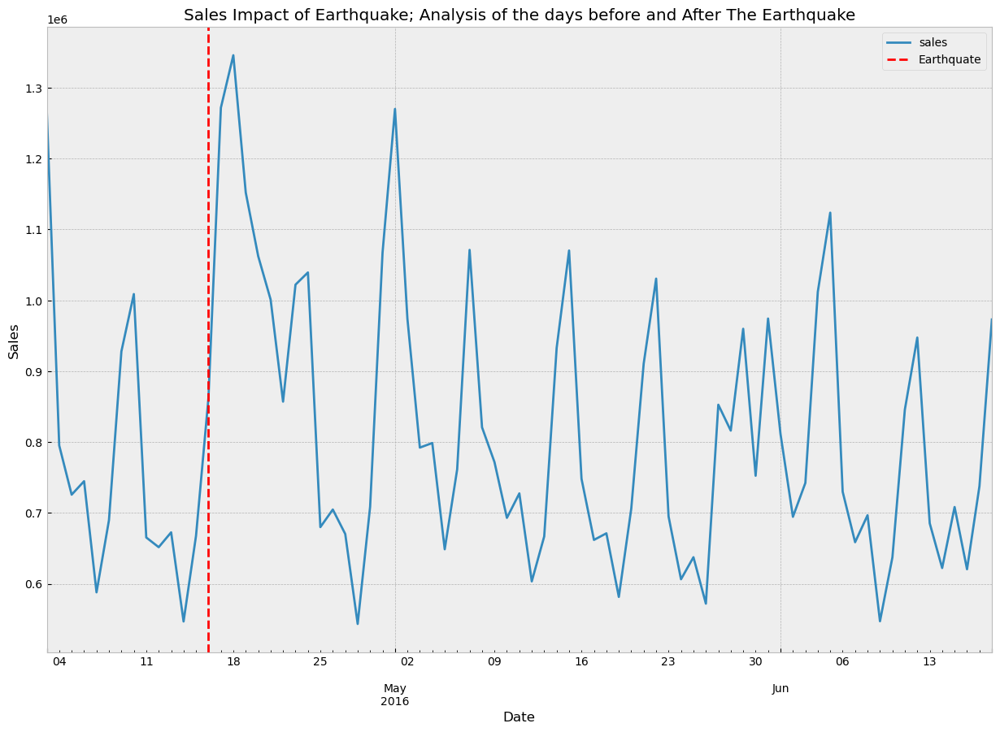

In [7]:
ax = train.loc[ 
    idx[:, :, '2016-04-03':'2016-06-18'], 
    ['sales']
].groupby('date').sum().plot(figsize = (15, 10))

plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Impact of Earthquake; Analysis of the days before and After The Earthquake')
# Highlight April 16th
ax.axvline(pd.to_datetime('2016-04-16'), color = 'red', linestyle = '--', label = 'Earthquate')
ax.legend()
plt.show();

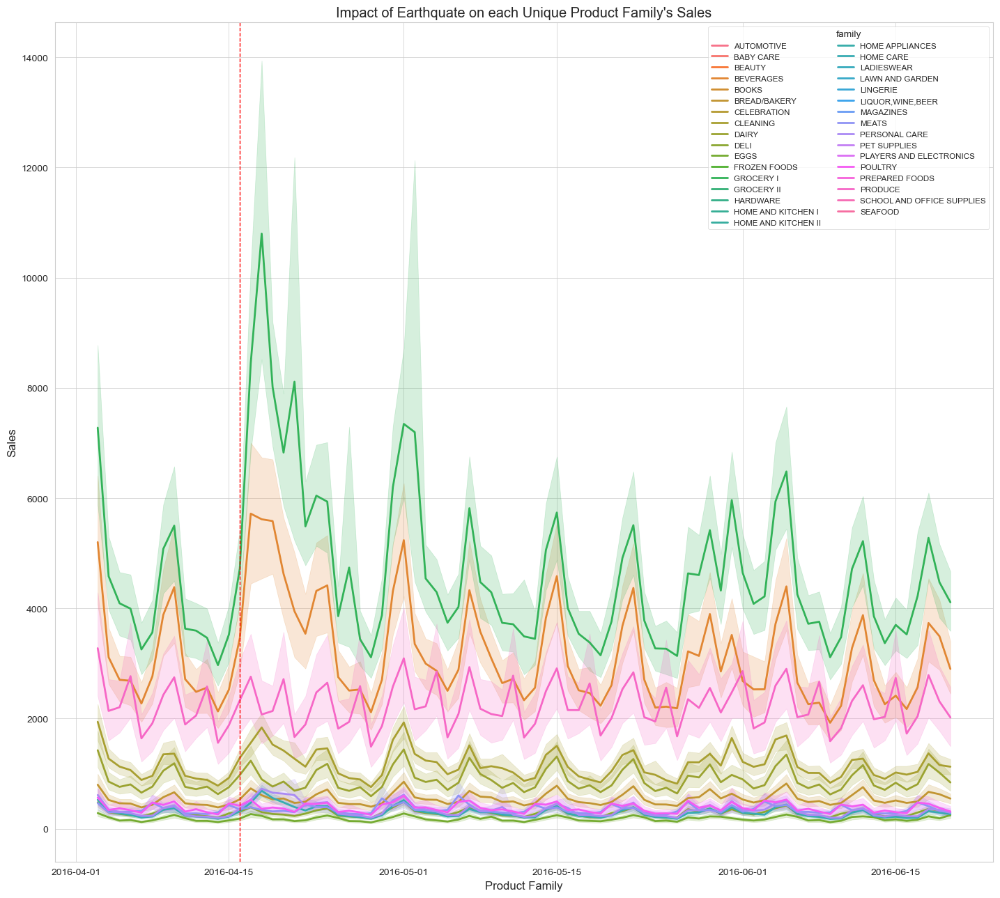

In [6]:
# Plot the earthquate time period to see sales by family of products
# Filter the data by the date we want and reset the index to also make it easy to group
df_fam = train.loc[
    idx[:, :, '2016-04-03':'2016-06-20'],
    ['sales']
].reset_index()

# Get top 12 families by total sales in earthquake period
top12 = (
    df_fam.groupby('family', observed = True)['sales'].sum().sort_values(ascending = False).nlargest(12).index
)

# Filter data for those top families
top_fam = df_fam[df_fam['family'].isin(top12)].copy()

# Ensure correct datatypes
top_fam['date'] = top_fam['date'].dt.to_timestamp()
top_fam['sales'] = pd.to_numeric(top_fam['sales'], errors = 'coerce')

# Order Family by total sales
family_order = (
    top_fam.groupby('family', observed = True)['sales'].sum().sort_values(ascending = False).index
)
top_fam['family'] = pd.Categorical(top_fam['family'], categories = top12, ordered = True)

#P lot 
sns.set_style("whitegrid")
plt.figure(figsize = (17, 13))
sns.lineplot(data = top_fam, x = 'date', y = 'sales', hue = 'family')

plt.xlabel("Product Family")
plt.ylabel("Sales")
plt.title("Impact of Earthquate on each Unique Product Family's Sales")

# Highlight Earthquake
earthquake_date = pd.Timestamp('2016-04-16')
plt.axvline(earthquake_date, color = 'red', linestyle = '--', linewidth = 1)
# plt.text(
#     earthquake_date,
#     top_fam['sales'].max()*0.95,
#     'Earthquake', # y
#     color = 'red', # s (the text)
#     rotation = 90,
#     verticalalignment = 'top'
# )

ax = plt.gca() # Get current axe

ax.annotate(
    'Earthquake',
    xy = (pd.Timestamp("2016-04-16"), top_fam['sales'].max()*0.95), # Arrow points near the peak
    xytext = (pd.Timestamp("2016-04-16"), top_fam['sales'].max()), # Text
    arrowprops= dict(facecolor = 'red', shrink= 0.05, width = 1, headwidth = 6),
    color = 'red',
    fontsize = 'medium',
    ha = 'right'
)


plt.legend(title = 'family', 
           ncol = 2,  # Split legend into two columns
           bbox_to_anchor = (1, 1), 
           fontsize = 'small', # Shrink font abit
           title_fontsize = 'medium',
           loc = 'upper right')
plt.tight_layout(rect = [0, 0, 0.85, 1])

# Save image
# Plt.savefig('earthquake_sales_impact-by-product-family.png', dpe = 300, bbox_inches = 'tight')
plt.show();

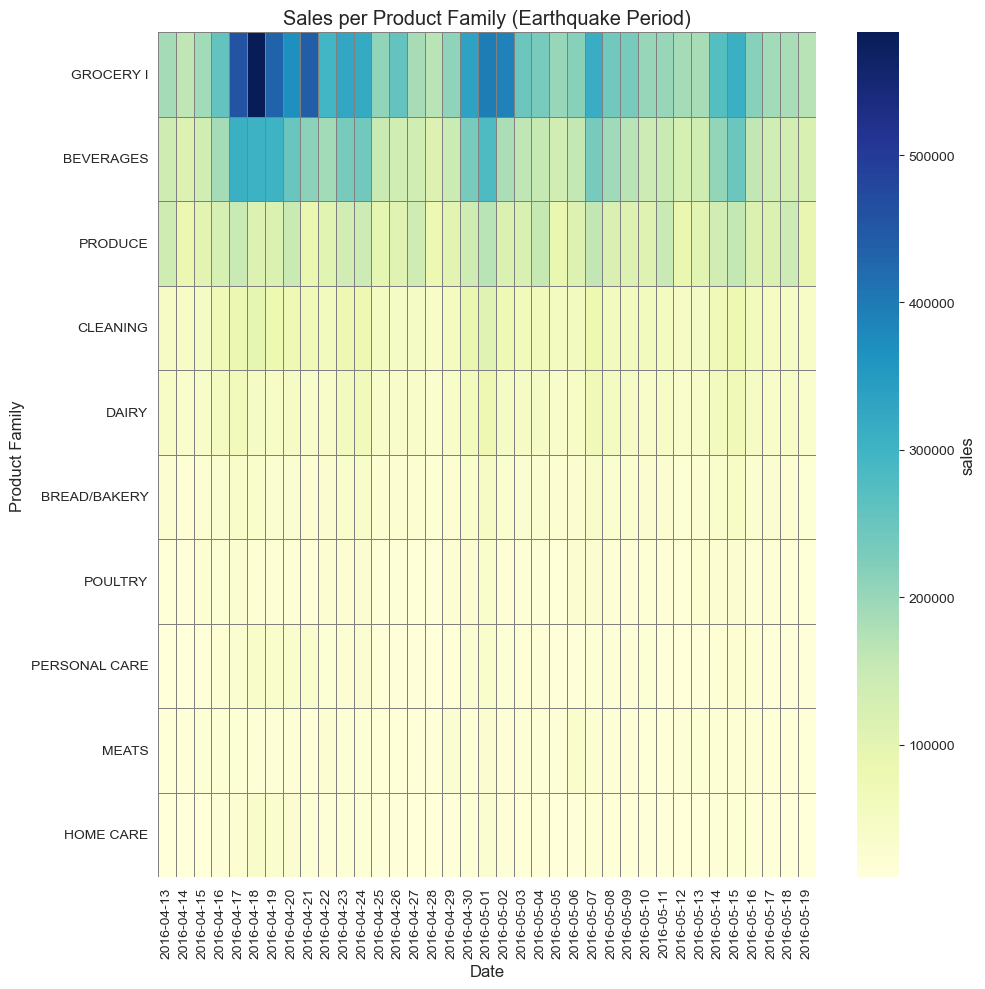

In [17]:
# We'll model the trends of the earthquake impact using SNS heatmap.
train_eq = train.loc[idx[:, :, '2016-04-13':'2016-05-19'], ['sales']].reset_index()

# Pivot to get families as rows, dates as columns
pivot_fam = train_eq.groupby(['family', 'date'], observed = True)['sales'].sum().unstack()

# Take only top 25 families
top10 = pivot_fam.sum(axis = 1).sort_values(ascending = False).index[:10]
pivot_fam10 = pivot_fam.loc[top10]

# Plot heatmap
plt.figure(figsize = (10, 10))
sns.heatmap(pivot_fam10, cmap = 'YlGnBu', linewidth = 0.5, linecolor = 'gray', cbar_kws = {'label':'sales'})
plt.title('Sales per Product Family (Earthquake Period)')
plt.xlabel('Date')
plt.ylabel('Product Family')
plt.tight_layout()

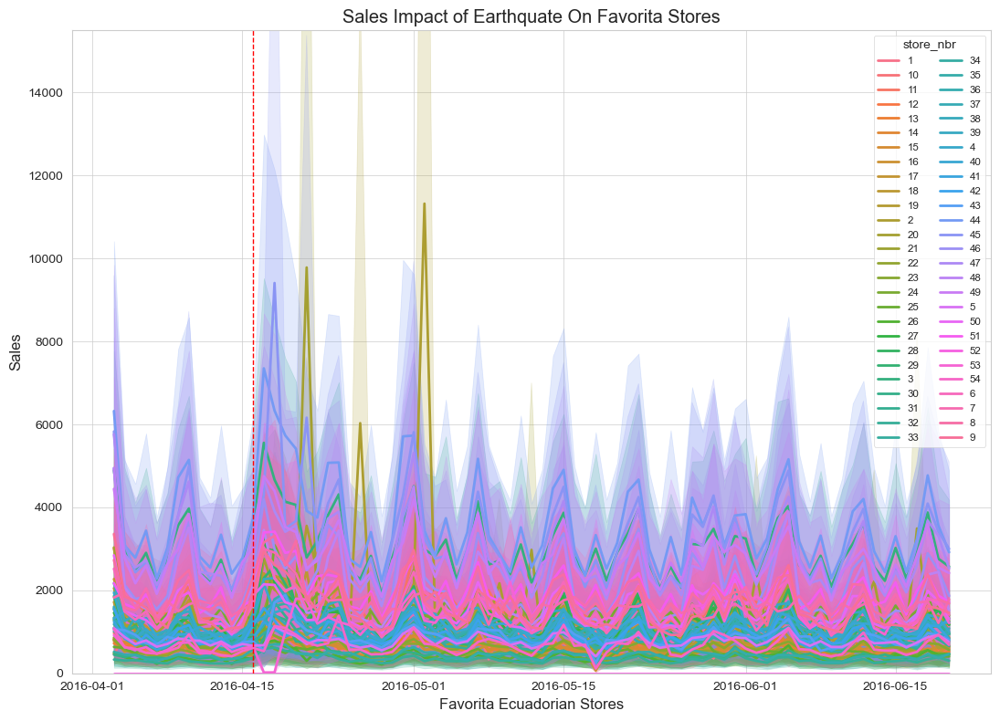

In [22]:
# Plot the eartquate time period to see sales by stores

# Filter the data by the date we want and reset the index to also make it easy to group
df_store = train.loc[
    idx[:, :, '2016-04-03':'2016-06-19'],
    ['sales']
].reset_index()

# Get top 12 stores by total sales in earthquake period
top12 = (
    df_store.groupby('store_nbr', observed = True)['sales'].sum().sort_values(ascending = False).nlargest(12).index
)

# Filter data for those top stores
top_store = df_store[df_store['store_nbr'].isin(top12)].copy()

# Ensure correct types
top_store['date'] = top_store['date'].dt.to_timestamp()
top_store['sales'] = pd.to_numeric(top_store['sales'], errors = 'coerce')

# Order Stores by total sales
store_order = (
    top_fam.groupby('store_nbr', observed = True)['sales'].sum().sort_values(ascending = False).index
)
top_store['store_nbr'] = pd.Categorical(top_store['store_nbr'], categories = top12, ordered = True)

#Plot
sns.set_style("whitegrid")
plt.figure(figsize = (13, 8))
sns.lineplot(data = top_fam, x = 'date', y = 'sales', hue = 'store_nbr')

plt.ylim(0, 15500)
plt.xlabel("Favorita Ecuadorian Stores")
plt.ylabel("Sales")
plt.title("Sales Impact of Earthquate On Favorita Stores")

# Highlight Earthquake
earthquake_date = pd.Timestamp('2016-04-16')
plt.axvline(earthquake_date, color = 'red', linestyle = '--', linewidth = 1)

ax = plt.gca() # Get current axe

ax.annotate(
    'Earthquake',
    xy = (pd.Timestamp("2016-04-16"), top_store['sales'].max()*0.95), # Arrow points near the peak
    xytext = (pd.Timestamp("2016-04-16"), top_store['sales'].max()), # Text
    arrowprops= dict(facecolor = 'red', shrink= 0.05, width = 1, headwidth = 6),
    color = 'red',
    fontsize = 'medium',
    ha = 'right'
)


plt.legend(title = 'store_nbr', 
           ncol = 2,  # Split legend into two columns
           bbox_to_anchor = (1, 1), 
           fontsize = 'small', # Shrink font abit
           title_fontsize = 'medium',
           loc = 'upper right')
plt.tight_layout(rect = [0, 0, 0.85, 1])

# Save image
# Plt.savefig('earthquake_sales_impact-on-Favorita-stores.png', dpi = 300, bbox_inches = 'tight')
plt.show();

In [ ]:
# We'll model the trends of the earthquake impact using SNS heatmap.
train_str = train.loc[idx[:, :, '2016-04-13':'2016-06-19'], ['sales']].reset_index()

# Pivot to get store IDs as rows, dates as columns
pivot_str = train_str.groupby(['store_nbr', 'date'], observed = True)['sales'].sum().unstack()

# # Take only top 25 stores
# top25_str = pivot_str.sum(axis = 1).sort_values(ascending = False).index[:25]
# pivot_str25 = pivot_str.loc[top25_str]

# Plot heatmap
plt.figure(figsize = (35, 25))
sns.heatmap(pivot_str, linewidth = 0.5, linecolor = 'black', cbar_kws = {'label':'sales'})
plt.title('Sales per Stores (Earthquake Period)')
plt.xlabel('Date')
plt.ylabel('Favorita Stores')
plt.tight_layout()

In [25]:
# From the figure we can see that there was drop in sales on the 14th and gradual increse till  
# above 100% between 18th and 19th and a gradual degrease from them till 28th
with pd.option_context('display.max_columns', None,
                       'display.max_rows', None,
                       'display.max_colwidth', None):
    display(train.loc[idx[:, :, '2016-04-13':'2016-04-30'], ['sales', 'onpromotion']])

sales  onpromotion
store_nbr family                     date                                 
1         AUTOMOTIVE                 2016-04-13      2.000000            0
                                     2016-04-14      2.000000            0
                                     2016-04-15      5.000000            0
                                     2016-04-16      6.000000            0
                                     2016-04-17      1.000000            0
                                     2016-04-18     14.000000            0
                                     2016-04-19      4.000000            0
                                     2016-04-20      9.000000            0
                                     2016-04-21      4.000000            0
                                     2016-04-22      2.000000            0
                                     2016-04-23      3.000000            0
                                     2016-04-24      0.000000            0
                                     2016-04-25     12.000000            0
                                     2016-04-26      1.000000            0
                                     2016-04-27      8.000000            0
                                     2016-04-28      6.000000            0
                                     2016-04-29      5.000000            0
                                     2016-04-30     12.000000            0
          BABY CARE                  2016-04-13      0.000000            0
                                     2016-04-14      0.000000            0
                                     2016-04-15      0.000000            0
                                     2016-04-16      0.000000            0
                                     2016-04-17      0.000000            0
                                     2016-04-18      0.000000            0
                                     2016-04-19      0.000000            0
                                     2016-04-20      0.000000            0
                                     2016-04-21      0.000000            0
                                     2016-04-22      0.000000            0
                                     2016-04-23      0.000000            0
                                     2016-04-24      0.000000            0
                                     2016-04-25      0.000000            0
                                     2016-04-26      0.000000            0
                                     2016-04-27      0.000000            0
                                     2016-04-28      0.000000            0
                                     2016-04-29      0.000000            0
                                     2016-04-30      0.000000            0
          BEAUTY                     2016-04-13      5.000000            0
                                     2016-04-14      1.000000            0
                                     2016-04-15      4.000000            0
                                     2016-04-16      4.000000            0
                                     2016-04-17      3.000000            0
                                     2016-04-18      3.000000            0
                                     2016-04-19      4.000000            0
                                     2016-04-20      4.000000            0
                                     2016-04-21      6.000000            0
                                     2016-04-22      5.000000            0
                                     2016-04-23      4.000000            0
                                     2016-04-24      5.000000            0
                                     2016-04-25      1.000000            0
                                     2016-04-26      4.000000            0
                                     2016-04-27      1.000000            0
                                     2016-04-28      1.000000            0
      

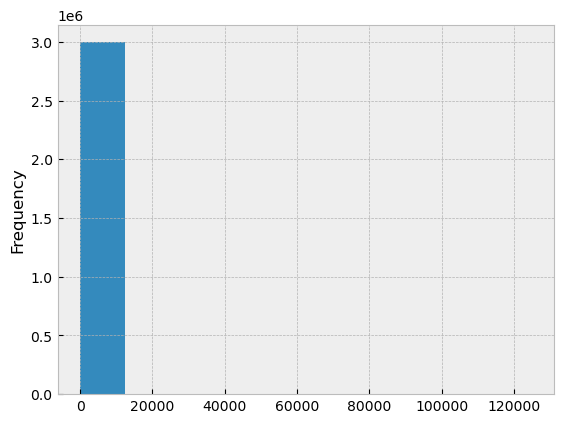

In [9]:
train['sales'].plot.hist();

In [ ]:
# Plot the distribution of sales by Family
for fam in train['family'].unique():
    train[train["family"] == fam]['sales'].plot.hist(alpha = 0.5, bins = 30, label = fam)

plt.lengend()
plt.title("Sales Distribution per Family")
plt.xlabel("Sales")
plt.ylabel("Frequency")
plt.show();

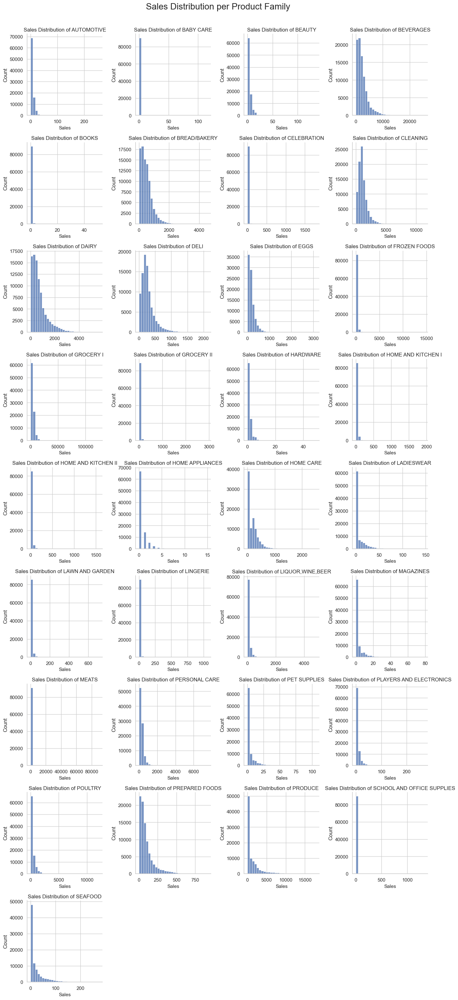

In [19]:
# Plot Distribution of sales by Product Families
filt = train.copy().reset_index()

sns.set(style = 'whitegrid')

# Create FacetGrid of all families
g = sns.FacetGrid(filt, col = 'family', col_wrap = 4, height = 3.5, sharex = False, sharey = False)

# PLot histogram of sales per family
g.map(sns.histplot, 'sales', bins = 30, kde = False)

# Add overall title
g.fig.suptitle("Sales Distribution per Product Family", fontsize = 20, y = 1.005)

# Format individual subplot titles (subtitles)
for ax, family in zip(g.axes.flat, filt['family'].unique()):
    ax.set_title(f"Sales Distribution of {family}")
    ax.set_xlabel("Sales", fontsize = 11)

plt.tight_layout()
plt.show();

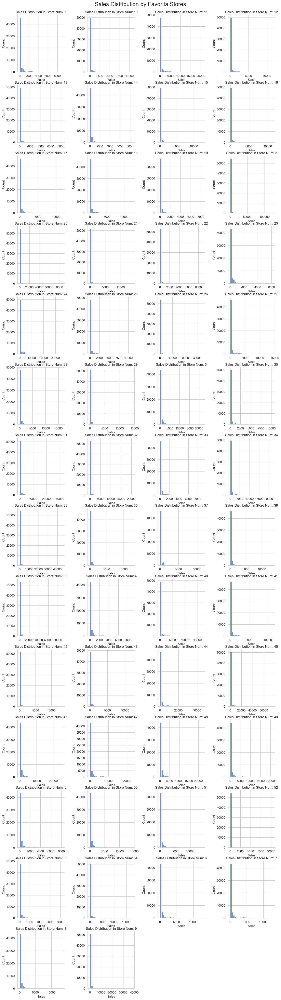

In [20]:
# Plot the Distribution of sales by Favorita store

sns.set(style = 'whitegrid')

# Create  FacetGrid of all stores
s = sns.FacetGrid(filt, col = "store_nbr", col_wrap = 4, height = 3.5, sharex = False, sharey = False)

# Plot Histogram of sales per store
s.map(sns.histplot, 'sales', bins = 30, kde = False)

# Because of the space between the suptitle and plots
# s.fig.subplots_adjust(top = 0.9)

# Add overall title
s.fig.suptitle("Sales Distribution by Favorita Stores", fontsize = 20, y = 1.005)

# Format individual subplot titles (sub-titltes)
for ax, store in zip(s.axes.flat, filt['store_nbr'].unique()):
    ax.set_title(f"Sales Distribution in Store Num: {store}", fontsize = 12 )
    ax.set_xlabel("Sales", fontsize = 11)

# plt.tight_layout()
plt.show();

In [13]:
train

id      sales  onpromotion
store_nbr family     date                                       
1         AUTOMOTIVE 2013-01-01        0   0.000000            0
                     2013-01-02     1782   2.000000            0
                     2013-01-03     3564   3.000000            0
                     2013-01-04     5346   3.000000            0
                     2013-01-05     7128   5.000000            0
...                                  ...        ...          ...
9         SEAFOOD    2017-08-11  2993759  23.830999            0
                     2017-08-12  2995541  16.859001            4
                     2017-08-13  2997323  20.000000            0
                     2017-08-14  2999105  17.000000            0
                     2017-08-15  3000887  16.000000            0

[3000888 rows x 3 columns]

### VISUALIZING THE TREND, SEASONALITY AND CYCLES

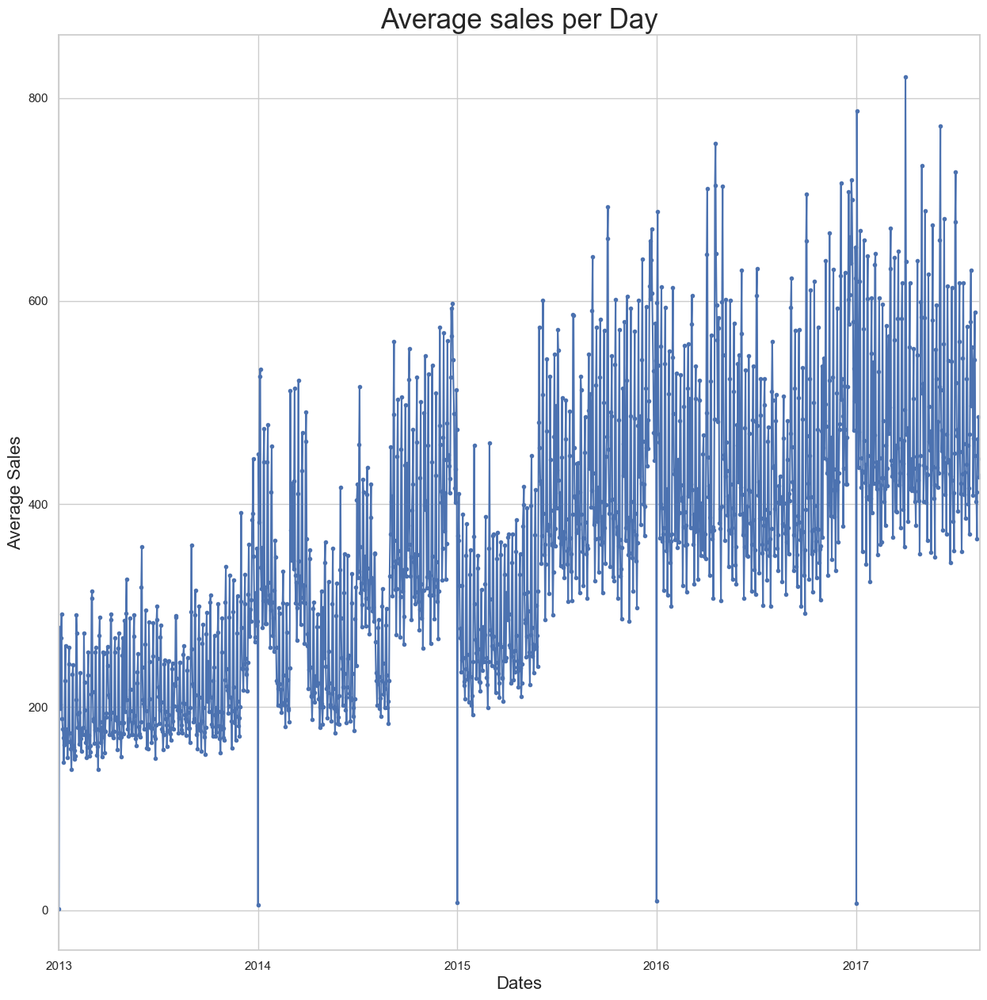

In [24]:
# Plot the average sales to see the trend, seasonality and cycles
fitl = train.copy().reset_index()

daily_avg = fitl.groupby("date")["sales"].mean()

daily_avg.plot(style = ".-", figsize = (15, 15), legend = False)

plt.title ("Average sales per Day", fontsize = 25) 
plt.xlabel("Dates", fontsize = 16)
plt.ylabel("Average Sales", fontsize = 16)
plt.show();

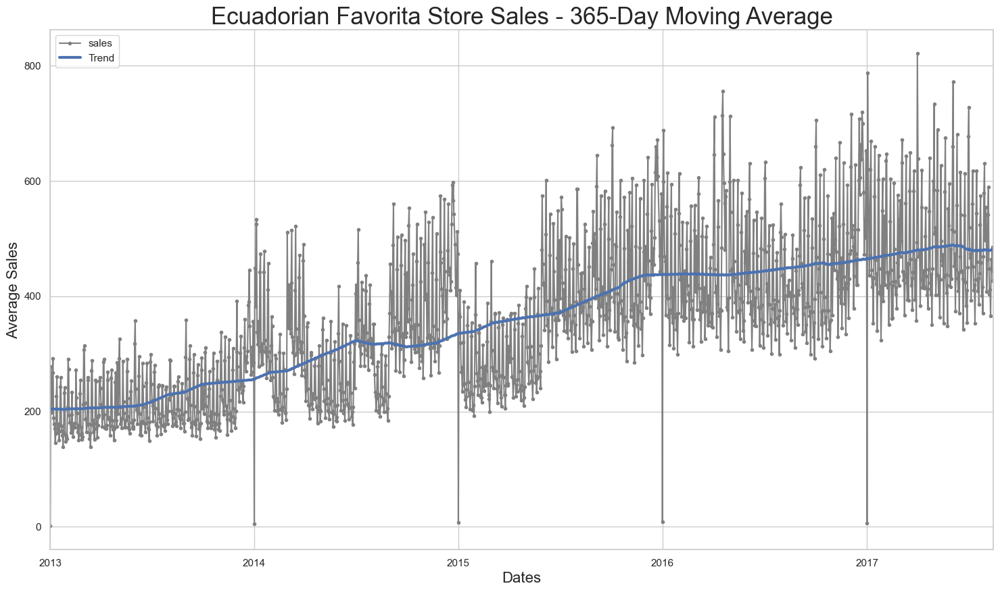

In [28]:
# Plot the trend using moving Average
trend = daily_avg.rolling(
    window = 365,            # 365-day window
    center = True,           # puts the average at the centre of the window
    min_periods = 183,       # choose about half the window size
).mean()                     # compute the mean (could also do median, std, min, max, ...)

ax = daily_avg.plot(style = ".-", color = "0.5", figsize = (18, 10))
ax = trend.plot(ax = ax, linewidth = 3, label = "Trend")

plt.title("Ecuadorian Favorita Store Sales - 365-Day Moving Average", fontsize = 25)
plt.xlabel("Dates",  fontsize = 16)
plt.ylabel("Average Sales", fontsize = 16)
plt.legend(loc = "upper left")
plt.show();

In [8]:
fitl = train.copy().reset_index()
fitl

,store_nbr,family,date,id,sales,onpromotion
0,1,AUTOMOTIVE,2013-01-01,0,0.000000,0
1,1,AUTOMOTIVE,2013-01-02,1782,2.000000,0
2,1,AUTOMOTIVE,2013-01-03,3564,3.000000,0
3,1,AUTOMOTIVE,2013-01-04,5346,3.000000,0
4,1,AUTOMOTIVE,2013-01-05,7128,5.000000,0
...,...,...,...,...,...,...
3008011,9,SEAFOOD,2017-08-11,2993759,23.830999,0
3008012,9,SEAFOOD,2017-08-12,2995541,16.859001,4
3008013,9,SEAFOOD,2017-08-13,2997323,20.000000,0
3008014,9,SEAFOOD,2017-08-14,2999105,17.000000,0


In [9]:
# We'd create two seasonal plots, year and week seasonal plots

# Days within a week
fitl["day"] = fitl.date.dt.dayofweek # the x-axis (freq)
fitl["week"] = fitl.date.dt.week # the seasonal period(period)

# Days within a year
fitl["dayofyear"] = fitl.date.dt.dayofyear
fitl["year"] = fitl.date.dt.year

fitl

,store_nbr,family,date,id,sales,onpromotion,day,week,dayofyear,year
0,1,AUTOMOTIVE,2013-01-01,0,0.000000,0,1,1,1,2013
1,1,AUTOMOTIVE,2013-01-02,1782,2.000000,0,2,1,2,2013
2,1,AUTOMOTIVE,2013-01-03,3564,3.000000,0,3,1,3,2013
3,1,AUTOMOTIVE,2013-01-04,5346,3.000000,0,4,1,4,2013
4,1,AUTOMOTIVE,2013-01-05,7128,5.000000,0,5,1,5,2013
...,...,...,...,...,...,...,...,...,...,...
3008011,9,SEAFOOD,2017-08-11,2993759,23.830999,0,4,32,223,2017
3008012,9,SEAFOOD,2017-08-12,2995541,16.859001,4,5,32,224,2017
3008013,9,SEAFOOD,2017-08-13,2997323,20.000000,0,6,32,225,2017
3008014,9,SEAFOOD,2017-08-14,2999105,17.000000,0,0,33,226,2017


In [10]:
# Calculate the average sales per day as that is easier to visualize.
avg_sales = fitl.groupby("date")["sales"].mean()
avg_sales

date
2013-01-01      1.409438
2013-01-02    278.390808
2013-01-03    202.840195
2013-01-04    198.911163
2013-01-05    267.873260
                 ...    
2017-08-11    463.733856
2017-08-12    444.798309
2017-08-13    485.768616
2017-08-14    427.004730
2017-08-15    427.980896
Freq: D, Name: sales, Length: 1688, dtype: float32

In [11]:
# We'd create two seasonal plots, year and week seasonal plots for the average sales

f = avg_sales.copy().to_frame()

# Days within a week
f["day"] = f.index.dayofweek             # the x-axis (freq)
f["week"] = f.index.week                 # the seasonal period (period)

# Days within a year
f["dayofyear"] = f.index.dayofyear
f["year"] = f.index.year

f

,sales,day,week,dayofyear,year
date,,,,,
2013-01-01,1.409438,1,1,1,2013
2013-01-02,278.390808,2,1,2,2013
2013-01-03,202.840195,3,1,3,2013
2013-01-04,198.911163,4,1,4,2013
2013-01-05,267.873260,5,1,5,2013
...,...,...,...,...,...
2017-08-11,463.733856,4,32,223,2017
2017-08-12,444.798309,5,32,224,2017
2017-08-13,485.768616,6,32,225,2017


In [10]:
# To create a weekly seasonal plots we have to group by day
frp = f['sales'].groupby(f.index.dayofweek)
frp

In [11]:
# To create the yearly seasonal plots we have to group by dayofyear
grp = f['sales'].groupby(f.index.dayofyear)
grp

Text(0.5, 1.0, 'Yearly Seasonal Plot for Ecuadorian Fovorita Store Avg Sales')

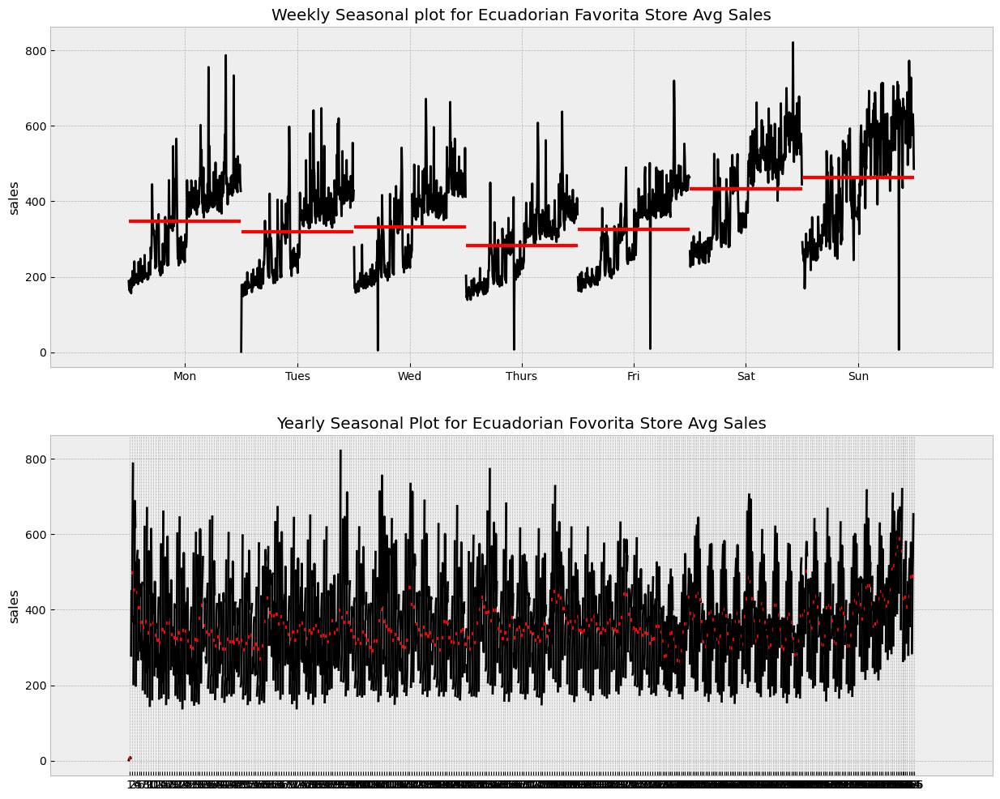

In [23]:
# Visualizing the seasonalities, weekly and yearly seasonality in one figure using seasonal_plot
fig, (ax0, ax1) = plt.subplots(2, 1, figsize = (15, 12))

# xticks to correctly identify the days of week
xticks0 = ['Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat', 'Sun']

# First plot, weekly seasonality
seasonal_plot(frp, xticks0, ylabel ='sales', ax = ax0)
ax0.set_title("Weekly Seasonal plot for Ecuadorian Favorita Store Avg Sales")

# xticks to correctly identify the days of year 
xticks1 = list(range(1, 367))

# Second plot, Yearly seasonality
seasonal_plot(grp, xticks1, ylabel = 'sales', ax = ax1)
ax1.set_title("Yearly Seasonal Plot for Ecuadorian Fovorita Store Avg Sales")

In [12]:
def Seasonal_plt(X, y, period, freq, ax = None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors = X[period].nunique(),)
    ax = sns.lineplot(
        x = freq,
        y = y,
        hue = period,
        data = X,
        errorbar = ('ci', False),
        ax = ax,
        palette = palette,
        legend = False,
    )
    ax.set_title(f"Seasonal PLot ({period}/{freq})")
    
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name, 
            xy =(1, y_),
            xytext = (6, 0), 
            color = line.get_color(),
            xycoords = ax.get_yaxis_transform(),
            textcoords = "offset points",
            size = 14, 
            va ="center",
        )
        
        return ax

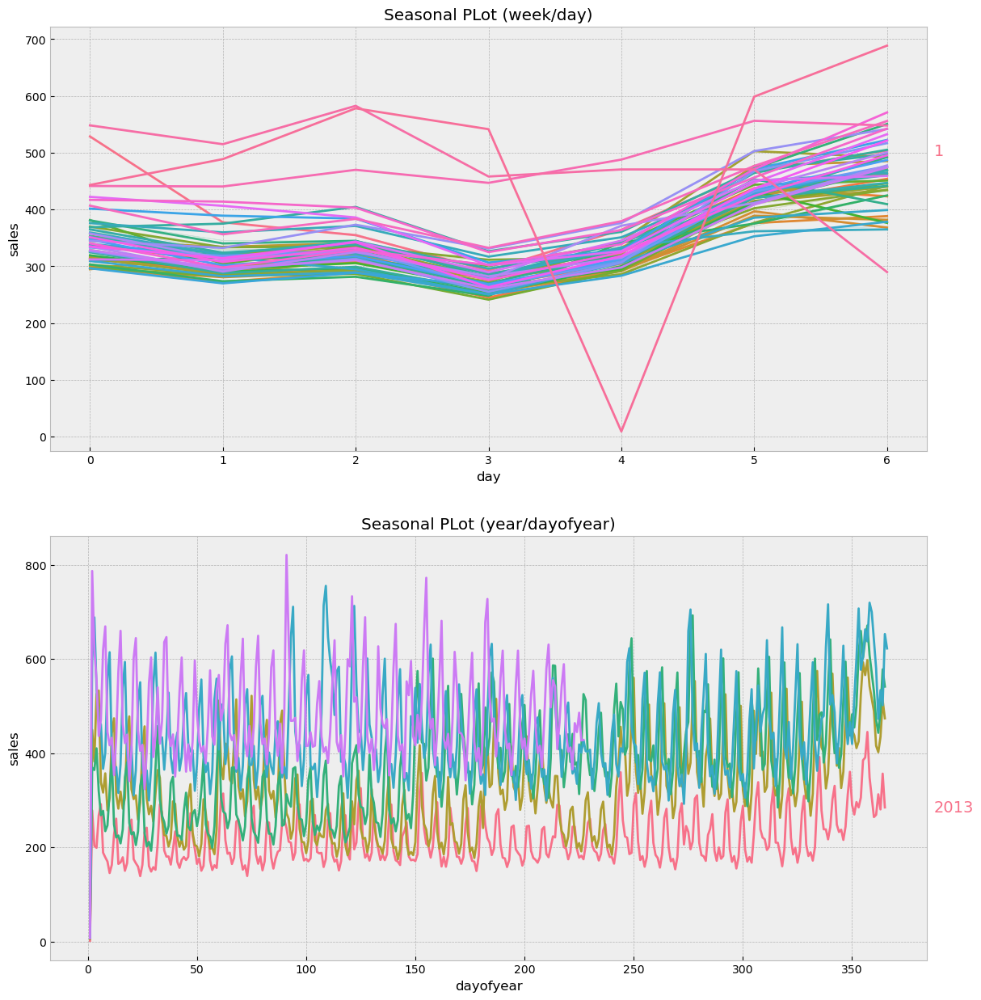

In [17]:
# Using the Function created to plot our seasonal plot that is more visually appealing

fig, (ax0, ax1) = plt.subplots(2, 1, figsize = (14, 15)) 
# Weekly Seasonal Plot
Seasonal_plt(X = f, y = 'sales', period = 'week', freq = 'day', ax = ax0);

# Yearly Seasonal plot
Seasonal_plt(X = f, y = 'sales', period = 'year', freq = 'dayofyear', ax = ax1);

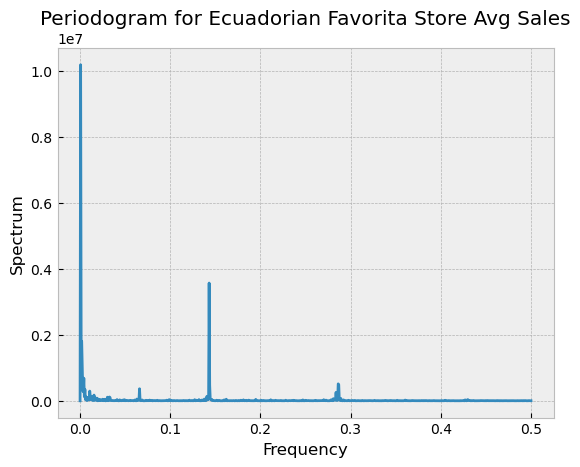

In [11]:
# Visualize repeating cycles using periodogram
freqs, spectrum = periodogram(avg_sales)
plt.plot(freqs, spectrum)
plt.xlabel("Frequency")
plt.ylabel("Spectrum")
plt.title("Periodogram for Ecuadorian Favorita Store Avg Sales")
plt.show();

In [13]:
# Create a more visually appealing Periodogram plot
def Periodogram_plt(ts, detrend = 'linear', ax = None):
    fs = pd.Timedelta("365D") / pd.Timedelta("1D")
    freq, spectrum = periodogram(
        ts,
        fs = fs,
        detrend = detrend,
        window = 'boxcar',
        scaling = "spectrum",
    )
    
    if ax is None:
        _, ax = plt.subplots(figsize = (15, 12))
    ax.step(freq, spectrum, color = "purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation = 30,
    )
    
    ax.ticklabel_format(axis = "y", style = "sci", scilimits = (0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    
    return ax

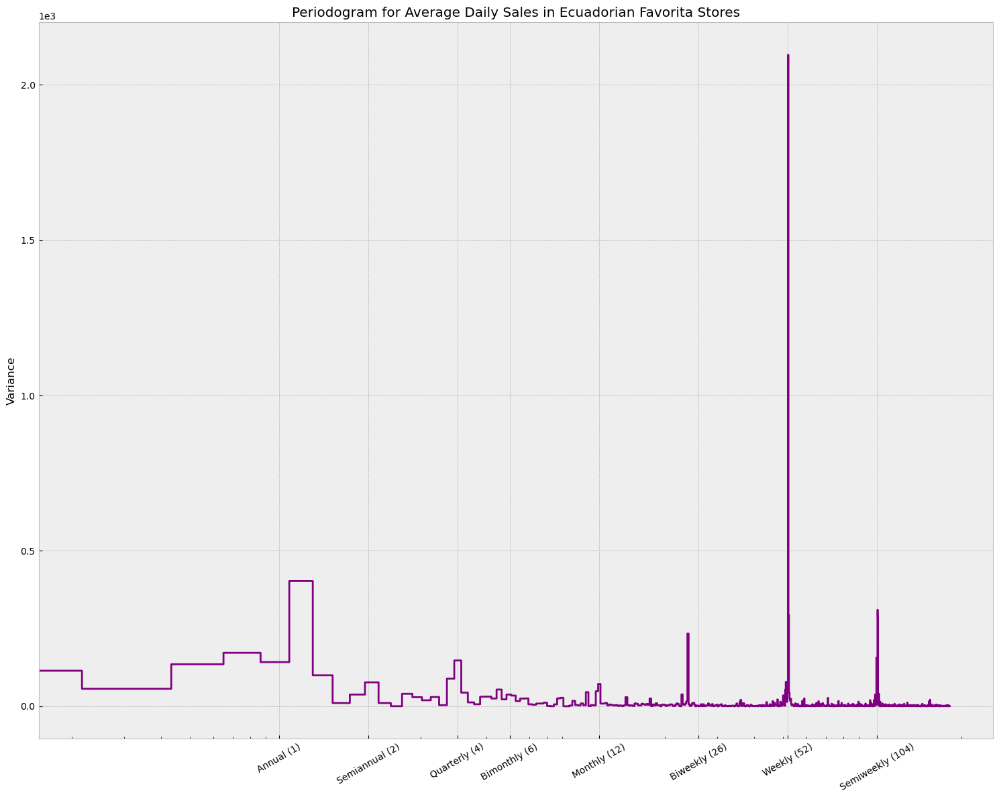

In [12]:
# Plot the periodogram of the average sales
Periodogram_plt(avg_sales)
plt.title("Periodogram for Average Daily Sales in Ecuadorian Favorita Stores")
plt.tight_layout();

In [14]:
onpromotion = train["onpromotion"]
onpromotion

store_nbr  family      date      
1          AUTOMOTIVE  2013-01-01    0
                       2013-01-02    0
                       2013-01-03    0
                       2013-01-04    0
                       2013-01-05    0
                                    ..
9          SEAFOOD     2017-08-11    0
                       2017-08-12    4
                       2017-08-13    0
                       2017-08-14    0
                       2017-08-15    0
Name: onpromotion, Length: 3008016, dtype: UInt32

## IMPORT TEST SET and ADDITIONAL CSV FILES

In [15]:
# Import Testset
test = pd.read_csv("test.csv",
                   dtype = {
                       'store_nbr' : 'category',
                       'family' : 'category',
                       'onpromotion' : 'uint32',
                   },
                   parse_dates = ['date'])
test['date'] = test.date.dt.to_period('D') 

test

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0
...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1
28508,3029396,2017-08-31,9,PREPARED FOODS,0
28509,3029397,2017-08-31,9,PRODUCE,1
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9


In [16]:
# Import other dasets like holiday datset, oil dataset too
stores_ds = pd.read_csv("stores.csv",
                       dtype = {
                           'store_nbr' : 'category',
                           'city' : 'category',
                           'state' : 'category',
                           'type' : 'category',
                           'cluster' : 'category'
                       })

oil_ds = pd.read_csv("oil.csv",
                     dtype = {
                         'dcoilwtico' : 'float32'
                     },
                     parse_dates = ['date'])
oil_ds['date'] = oil_ds.date.dt.to_period('D')

holiday_ds = pd.read_csv("holidays_events.csv",
                         parse_dates = ["date"])
holiday_ds["date"] = holiday_ds.date.dt.to_period('D')

trans_ds = pd.read_csv("transactions.csv",
                       parse_dates = ['date'])
trans_ds['date'] = trans_ds.date.dt.to_period('D')

# Create a list of train dates to ensure you get only the train dates values into our trainset
train_dates = train.reset_index()["date"].unique()

# Create a list of test dates to ensure you get only the test date values into the testset
test_dates = test.reset_index()["date"].unique()

In [17]:
stores_ds

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [18]:
oil_ds

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.139999
2,2013-01-03,92.970001
3,2013-01-04,93.120003
4,2013-01-07,93.199997
...,...,...
1213,2017-08-25,47.650002
1214,2017-08-28,46.400002
1215,2017-08-29,46.459999
1216,2017-08-30,45.959999


In [20]:
holiday_ds

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


In [21]:
trans_ds

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [22]:
avg_sales

date
2013-01-01      1.409438
2013-01-02    278.390808
2013-01-03    202.840195
2013-01-04    198.911163
2013-01-05    267.873260
                 ...    
2017-08-11    463.733856
2017-08-12    444.798309
2017-08-13    485.768616
2017-08-14    427.004730
2017-08-15    427.980896
Freq: D, Name: sales, Length: 1688, dtype: float32

In [17]:
# Use DeterministicProcess and CalenderFourier for Feature Engineering
y = avg_sales.copy()

# Create CalenderForier Features
yr_feat = CalendarFourier(freq = 'Y', order = 5)              # Create Yearly seasonality

mn_feat = CalendarFourier(freq = 'Q', order = 2)               # Create Monthly seasonality

dp = DeterministicProcess(
    index = y.index,
    constant = True,
    order = 1,
    seasonal = True,
    additional_terms = [yr_feat, mn_feat],
    drop = True,
)

C:\Users\USER\anaconda3\Lib\site-packages\statsmodels\tsa\deterministic.py:569: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  index = pd.date_range("2020-01-01", freq=freq, periods=1)
C:\Users\USER\anaconda3\Lib\site-packages\statsmodels\tsa\deterministic.py:569: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  index = pd.date_range("2020-01-01", freq=freq, periods=1)


In [18]:
X = dp.in_sample()
X

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)"
date,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211


In [25]:
train_dates

<PeriodArray>
['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04', '2013-01-05',
 '2013-01-06', '2013-01-07', '2013-01-08', '2013-01-09', '2013-01-10',
 ...
 '2017-08-06', '2017-08-07', '2017-08-08', '2017-08-09', '2017-08-10',
 '2017-08-11', '2017-08-12', '2017-08-13', '2017-08-14', '2017-08-15']
Length: 1688, dtype: period[D]

In [26]:
test_dates

<PeriodArray>
['2017-08-16', '2017-08-17', '2017-08-18', '2017-08-19', '2017-08-20',
 '2017-08-21', '2017-08-22', '2017-08-23', '2017-08-24', '2017-08-25',
 '2017-08-26', '2017-08-27', '2017-08-28', '2017-08-29', '2017-08-30',
 '2017-08-31']
Length: 16, dtype: period[D]

In [19]:
# First for our Additional Csv files that have date, 
# we have to make sure that they only contain data of dates from trainset or testset only

# Creating train and test oil tables
train_oil = oil_ds[oil_ds["date"].isin(train_dates)]
test_oil = oil_ds[oil_ds["date"].isin(test_dates)]

In [28]:
train_oil

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1201,2017-08-09,49.59
1202,2017-08-10,48.54
1203,2017-08-11,48.81
1204,2017-08-14,47.59


In [29]:
test_oil

,date,dcoilwtico
1206,2017-08-16,46.80
1207,2017-08-17,47.07
1208,2017-08-18,48.59
1209,2017-08-21,47.39
1210,2017-08-22,47.65
1211,2017-08-23,48.45
1212,2017-08-24,47.24
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46


In [20]:
# Creating train and test transaction tables
train_trans = trans_ds[trans_ds["date"].isin(train_dates)]
test_trans = trans_ds[trans_ds["date"].isin(test_dates)]

In [31]:
train_trans

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [32]:
test_trans

,date,store_nbr,transactions


> We have not been given values for transactions in the duration of our test set, so we will not be using the transaction dataframe

In [33]:
# Check to see the unique descriptions of holiday
hol_desc = holiday_ds["description"].unique()
hol_desc

array(['Fundacion de Manta', 'Provincializacion de Cotopaxi',
       'Fundacion de Cuenca', 'Cantonizacion de Libertad',
       'Cantonizacion de Riobamba', 'Cantonizacion del Puyo',
       'Cantonizacion de Guaranda', 'Provincializacion de Imbabura',
       'Cantonizacion de Latacunga', 'Fundacion de Machala',
       'Fundacion de Santo Domingo', 'Cantonizacion de El Carmen',
       'Cantonizacion de Cayambe', 'Fundacion de Esmeraldas',
       'Primer Grito de Independencia', 'Fundacion de Riobamba',
       'Fundacion de Ambato', 'Fundacion de Ibarra',
       'Cantonizacion de Quevedo', 'Independencia de Guayaquil',
       'Traslado Independencia de Guayaquil', 'Dia de Difuntos',
       'Independencia de Cuenca', 'Provincializacion de Santo Domingo',
       'Provincializacion Santa Elena', 'Independencia de Guaranda',
       'Independencia de Latacunga', 'Independencia de Ambato',
       'Fundacion de Quito-1', 'Fundacion de Quito', 'Fundacion de Loja',
       'Navidad-4', 'Cantonizac

In [34]:
# Number of unique holiday description
num_unique = holiday_ds["description"].nunique
num_unique

<bound method IndexOpsMixin.nunique of 0                 Fundacion de Manta
1      Provincializacion de Cotopaxi
2                Fundacion de Cuenca
3          Cantonizacion de Libertad
4          Cantonizacion de Riobamba
                   ...              
345                        Navidad-3
346                        Navidad-2
347                        Navidad-1
348                          Navidad
349                        Navidad+1
Name: description, Length: 350, dtype: object>

In [35]:
holiday_ds["description"].nunique()

103

In [36]:
holiday_ds["description"].value_counts().nlargest(5)

description
Carnaval                              10
Fundacion de Cuenca                    7
Fundacion de Ibarra                    7
Fundacion de Quito                     6
Provincializacion de Santo Domingo     6
Name: count, dtype: int64

In [37]:
holiday_ds["description"].value_counts().nlargest(20)

description
Carnaval                              10
Fundacion de Cuenca                    7
Fundacion de Ibarra                    7
Fundacion de Quito                     6
Provincializacion de Santo Domingo     6
Provincializacion Santa Elena          6
Independencia de Guaranda              6
Independencia de Latacunga             6
Independencia de Ambato                6
Fundacion de Quito-1                   6
Fundacion de Manta                     6
Dia de Difuntos                        6
Navidad-4                              6
Cantonizacion de Salinas               6
Navidad-3                              6
Navidad-2                              6
Navidad-1                              6
Navidad                                6
Navidad+1                              6
Fundacion de Loja                      6
Name: count, dtype: int64

In [38]:
holiday_ds["description"].value_counts().nlargest(30)

description
Carnaval                              10
Fundacion de Cuenca                    7
Fundacion de Ibarra                    7
Fundacion de Quito                     6
Provincializacion de Santo Domingo     6
Provincializacion Santa Elena          6
Independencia de Guaranda              6
Independencia de Latacunga             6
Independencia de Ambato                6
Fundacion de Quito-1                   6
Fundacion de Manta                     6
Dia de Difuntos                        6
Navidad-4                              6
Cantonizacion de Salinas               6
Navidad-3                              6
Navidad-2                              6
Navidad-1                              6
Navidad                                6
Navidad+1                              6
Fundacion de Loja                      6
Independencia de Cuenca                6
Provincializacion de Cotopaxi          6
Fundacion de Santo Domingo             6
Cantonizacion de Libertad              6
Cant

> Engineer features from our holiday dataset to enrich our train and test set.

In [21]:
# We will be making holidays that affect certain region, with respect to the stores
# Make a copy of store
store = stores_ds.copy()
store

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [22]:
# Create a National Holiday tag.
nat_hol = holiday_ds[holiday_ds["locale"] == 'National'][['date']]
nat_hol

,date
14,2012-08-10
19,2012-10-09
20,2012-10-12
21,2012-11-02
22,2012-11-03
...,...
345,2017-12-22
346,2017-12-23
347,2017-12-24
348,2017-12-25


In [23]:
# Create a column that says whether a date is a national holiday or not 
nat_hol["is_national_holiday"] = True
nat_hol

,date,is_national_holiday
14,2012-08-10,True
19,2012-10-09,True
20,2012-10-12,True
21,2012-11-02,True
22,2012-11-03,True
...,...,...
345,2017-12-22,True
346,2017-12-23,True
347,2017-12-24,True
348,2017-12-25,True


In [24]:
# Create regional holiday
regional = holiday_ds[holiday_ds["locale"] == "Regional"]
regional

,date,type,locale,locale_name,description,transferred
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
23,2012-11-06,Holiday,Regional,Santo Domingo de los Tsachilas,Provincializacion de Santo Domingo,False
24,2012-11-07,Holiday,Regional,Santa Elena,Provincializacion Santa Elena,False
47,2013-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
58,2013-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
76,2013-11-06,Holiday,Regional,Santo Domingo de los Tsachilas,Provincializacion de Santo Domingo,False
77,2013-11-07,Holiday,Regional,Santa Elena,Provincializacion Santa Elena,False
96,2014-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
112,2014-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False


In [25]:
# Merge the regional df with the stores df to create a new df that shows which stores are affected by the holiday
reg_hol = pd.merge(store, 
                   regional, 
                   left_on = "state", right_on = "locale_name"
                  )[["store_nbr", "date"]].assign(is_regional_holiday = True)

reg_hol

,store_nbr,date,is_regional_holiday
0,5,2012-11-06,True
1,5,2013-11-06,True
2,5,2014-11-06,True
3,5,2015-11-06,True
4,5,2016-11-06,True
5,5,2017-11-06,True
6,12,2012-04-01,True
7,12,2013-04-01,True
8,12,2014-04-01,True
9,12,2015-04-01,True


In [26]:
# Create local holiday instances
local = holiday_ds[holiday_ds["locale"] == "Local"]
local

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
...,...,...,...,...,...,...
339,2017-12-05,Additional,Local,Quito,Fundacion de Quito-1,False
340,2017-12-06,Holiday,Local,Quito,Fundacion de Quito,True
341,2017-12-08,Holiday,Local,Loja,Fundacion de Loja,False
342,2017-12-08,Transfer,Local,Quito,Traslado Fundacion de Quito,False


In [27]:
# Merge the local holiday df with the store df
local_hol = pd.merge(
    store,
    local,
    left_on = "city",
    right_on = "locale_name"
)[["store_nbr", "date"]].assign(is_local_holiday = True)

local_hol

,store_nbr,date,is_local_holiday
0,1,2012-12-05,True
1,1,2012-12-06,True
2,1,2013-12-05,True
3,1,2013-12-06,True
4,1,2014-12-05,True
...,...,...,...
507,54,2013-07-03,True
508,54,2014-07-03,True
509,54,2015-07-03,True
510,54,2016-07-03,True


In [35]:
X

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)"
date,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211


In [47]:
holiday_ds

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


In [28]:
# Create a boolean obserserved holiday column
hol = holiday_ds.copy()

hol.set_index("date", inplace = True)
hol = pd.get_dummies(data = holiday_ds, columns = ["type"], prefix = "holiday_type")
hol

,date,locale,locale_name,description,transferred,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day
0,2012-03-02,Local,Manta,Fundacion de Manta,False,False,False,False,True,False,False
1,2012-04-01,Regional,Cotopaxi,Provincializacion de Cotopaxi,False,False,False,False,True,False,False
2,2012-04-12,Local,Cuenca,Fundacion de Cuenca,False,False,False,False,True,False,False
3,2012-04-14,Local,Libertad,Cantonizacion de Libertad,False,False,False,False,True,False,False
4,2012-04-21,Local,Riobamba,Cantonizacion de Riobamba,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...
345,2017-12-22,National,Ecuador,Navidad-3,False,True,False,False,False,False,False
346,2017-12-23,National,Ecuador,Navidad-2,False,True,False,False,False,False,False
347,2017-12-24,National,Ecuador,Navidad-1,False,True,False,False,False,False,False
348,2017-12-25,National,Ecuador,Navidad,False,False,False,False,True,False,False


In [29]:
hol["holiday_transferred"] = hol["transferred"]
hol = hol.set_index('date')
hol

,locale,locale_name,description,transferred,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred
date,,,,,,,,,,,
2012-03-02,Local,Manta,Fundacion de Manta,False,False,False,False,True,False,False,False
2012-04-01,Regional,Cotopaxi,Provincializacion de Cotopaxi,False,False,False,False,True,False,False,False
2012-04-12,Local,Cuenca,Fundacion de Cuenca,False,False,False,False,True,False,False,False
2012-04-14,Local,Libertad,Cantonizacion de Libertad,False,False,False,False,True,False,False,False
2012-04-21,Local,Riobamba,Cantonizacion de Riobamba,False,False,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
2017-12-22,National,Ecuador,Navidad-3,False,True,False,False,False,False,False,False
2017-12-23,National,Ecuador,Navidad-2,False,True,False,False,False,False,False,False
2017-12-24,National,Ecuador,Navidad-1,False,True,False,False,False,False,False,False


> Create a colummn that tells us if there is a holiday on that day or not

In [30]:
hol["is_holiday"] = hol["holiday_transferred"] == False
hol

,locale,locale_name,description,transferred,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday
date,,,,,,,,,,,,
2012-03-02,Local,Manta,Fundacion de Manta,False,False,False,False,True,False,False,False,True
2012-04-01,Regional,Cotopaxi,Provincializacion de Cotopaxi,False,False,False,False,True,False,False,False,True
2012-04-12,Local,Cuenca,Fundacion de Cuenca,False,False,False,False,True,False,False,False,True
2012-04-14,Local,Libertad,Cantonizacion de Libertad,False,False,False,False,True,False,False,False,True
2012-04-21,Local,Riobamba,Cantonizacion de Riobamba,False,False,False,False,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-22,National,Ecuador,Navidad-3,False,True,False,False,False,False,False,False,True
2017-12-23,National,Ecuador,Navidad-2,False,True,False,False,False,False,False,False,True
2017-12-24,National,Ecuador,Navidad-1,False,True,False,False,False,False,False,False,True


In [31]:
# Create a column that tells if it is christmas or not
hol["is_christmas"] = hol["description"] == 'Navidad'
hol

,locale,locale_name,description,transferred,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas
date,,,,,,,,,,,,,
2012-03-02,Local,Manta,Fundacion de Manta,False,False,False,False,True,False,False,False,True,False
2012-04-01,Regional,Cotopaxi,Provincializacion de Cotopaxi,False,False,False,False,True,False,False,False,True,False
2012-04-12,Local,Cuenca,Fundacion de Cuenca,False,False,False,False,True,False,False,False,True,False
2012-04-14,Local,Libertad,Cantonizacion de Libertad,False,False,False,False,True,False,False,False,True,False
2012-04-21,Local,Riobamba,Cantonizacion de Riobamba,False,False,False,False,True,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-22,National,Ecuador,Navidad-3,False,True,False,False,False,False,False,False,True,False
2017-12-23,National,Ecuador,Navidad-2,False,True,False,False,False,False,False,False,True,False
2017-12-24,National,Ecuador,Navidad-1,False,True,False,False,False,False,False,False,True,False


In [32]:
hol = hol.drop(["locale", "locale_name", "description", "transferred"], axis = 1)
hol

,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas
date,,,,,,,,,
2012-03-02,False,False,False,True,False,False,False,True,False
2012-04-01,False,False,False,True,False,False,False,True,False
2012-04-12,False,False,False,True,False,False,False,True,False
2012-04-14,False,False,False,True,False,False,False,True,False
2012-04-21,False,False,False,True,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...
2017-12-22,True,False,False,False,False,False,False,True,False
2017-12-23,True,False,False,False,False,False,False,True,False
2017-12-24,True,False,False,False,False,False,False,True,False


In [41]:
# To avoid duplication of date
r = nat_hol.value_counts()

print(r[r > 2].index.tolist())

[]


> Divide all our combined dataframes with both test and train dates into seperate dataframes using the dates

In [33]:
# Divide the national holiday dataframe 
trnat = nat_hol[nat_hol["date"].isin(train_dates)]

train_nat = trnat.groupby(trnat.date).any()
test_nat = nat_hol[nat_hol["date"].isin(test_dates)]

train_nat

,is_national_holiday
date,
2013-01-01,True
2013-01-05,True
2013-01-12,True
2013-02-11,True
2013-02-12,True
...,...
2017-05-14,True
2017-05-24,True
2017-05-26,True


In [43]:
train_nat[train_nat.index.duplicated(keep = False)]

,is_national_holiday
date,


In [34]:
train_nat = train_nat.reset_index()
train_nat

,date,is_national_holiday
0,2013-01-01,True
1,2013-01-05,True
2,2013-01-12,True
3,2013-02-11,True
4,2013-02-12,True
...,...,...
142,2017-05-14,True
143,2017-05-24,True
144,2017-05-26,True
145,2017-08-10,True


In [45]:
test_nat

,date,is_national_holiday


In [35]:
# Since the test_nat has no values we would assign values to it, False
test_nat = test_nat.assign(date = test_dates)
test_nat["is_national_holiday"] = False

test_nat

,date,is_national_holiday
0,2017-08-16,False
1,2017-08-17,False
2,2017-08-18,False
3,2017-08-19,False
4,2017-08-20,False
5,2017-08-21,False
6,2017-08-22,False
7,2017-08-23,False
8,2017-08-24,False
9,2017-08-25,False


In [60]:
# Check theat there are no duplicated values for test_nat
q = test_nat.date.value_counts()
print(q[q>2].tolist())

[]


In [36]:
# Divide up our regional holiday
train_reg = reg_hol[reg_hol['date'].isin(train_dates)]
test_reg = reg_hol[reg_hol['date'].isin(test_dates)]

train_reg

,store_nbr,date,is_regional_holiday
1,5,2013-11-06,True
2,5,2014-11-06,True
3,5,2015-11-06,True
4,5,2016-11-06,True
7,12,2013-04-01,True
8,12,2014-04-01,True
9,12,2015-04-01,True
10,12,2016-04-01,True
11,12,2017-04-01,True
13,13,2013-04-01,True


In [38]:
train_reg.set_index(['store_nbr', 'date'])[train_reg.set_index(['store_nbr', 'date']).index.duplicated(keep = False)]

,,is_regional_holiday
store_nbr,date,


In [62]:
test_reg

,store_nbr,date,is_regional_holiday


In [37]:
# Create a coumln with values = False values for is_regional_holiday
test_reg = test_reg.assign(date = test_dates)
test_reg['is_regional_holiday'] = False
test_reg.drop("store_nbr", axis = 1)

test_reg

,store_nbr,date,is_regional_holiday
0,NaN,2017-08-16,False
1,NaN,2017-08-17,False
2,NaN,2017-08-18,False
3,NaN,2017-08-19,False
4,NaN,2017-08-20,False
5,NaN,2017-08-21,False
6,NaN,2017-08-22,False
7,NaN,2017-08-23,False
8,NaN,2017-08-24,False
9,NaN,2017-08-25,False


In [38]:
test_reg =  test_reg.drop('store_nbr', axis = 1)
test_reg

,date,is_regional_holiday
0,2017-08-16,False
1,2017-08-17,False
2,2017-08-18,False
3,2017-08-19,False
4,2017-08-20,False
5,2017-08-21,False
6,2017-08-22,False
7,2017-08-23,False
8,2017-08-24,False
9,2017-08-25,False


In [39]:
# Divide the local holiday into the train and test using the dates
train_local = local_hol[local_hol["date"].isin(train_dates)]
test_local = local_hol[local_hol["date"].isin(test_dates)]

train_local

,store_nbr,date,is_local_holiday
2,1,2013-12-05,True
3,1,2013-12-06,True
4,1,2014-12-05,True
5,1,2014-12-06,True
6,1,2015-12-05,True
...,...,...,...
507,54,2013-07-03,True
508,54,2014-07-03,True
509,54,2015-07-03,True
510,54,2016-07-03,True


In [51]:
train_local.set_index(['store_nbr', 'date'])[train_local.set_index(['store_nbr', 'date']).index.duplicated(keep = False)]

is_local_holiday
store_nbr date                        
24        2016-07-24              True
          2016-07-24              True
26        2016-07-24              True
          2016-07-24              True
28        2016-07-24              True
          2016-07-24              True
29        2016-07-24              True
          2016-07-24              True
30        2016-07-24              True
          2016-07-24              True
32        2016-07-24              True
          2016-07-24              True
34        2016-07-24              True
          2016-07-24              True
51        2016-07-24              True
          2016-07-24              True

In [40]:
train_local = train_local.set_index(['store_nbr', 'date'])
# train_local = train_local.groupby(train_local.index).any()
train_local

is_local_holiday
store_nbr date                        
1         2013-12-05              True
          2013-12-06              True
          2014-12-05              True
          2014-12-06              True
          2015-12-05              True
...                                ...
54        2013-07-03              True
          2014-07-03              True
          2015-07-03              True
          2016-07-03              True
          2017-07-03              True

[379 rows x 1 columns]

In [41]:
train_local = train_local.reset_index().groupby(["store_nbr", "date"]).any()
train_local = train_local.reset_index()
train_local

C:\Users\USER\AppData\Local\Temp\ipykernel_3348\3752501927.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  train_local = train_local.reset_index().groupby(["store_nbr", "date"]).any()


,store_nbr,date,is_local_holiday
0,1,2013-03-02,NaN
1,1,2013-04-12,NaN
2,1,2013-04-14,NaN
3,1,2013-04-21,NaN
4,1,2013-05-12,NaN
...,...,...,...
5719,9,2017-07-23,NaN
5720,9,2017-07-24,NaN
5721,9,2017-07-25,NaN
5722,9,2017-08-05,NaN


In [54]:
test_local

,store_nbr,date,is_local_holiday
251,23,2017-08-24,True
481,50,2017-08-24,True


In [42]:
# Divide the holiday dataframe into train and test set by dates
trhol = hol[hol.index.isin(train_dates)]

train_hol =trhol.groupby(trhol.index).any()          # To prevent duplication of rows, we would merge our rows with 
# same date index and give it the requirement that if there is any True value in the duplicated rows under the same column, 
# it will pick a True for that column under the merged rows

test_hol = hol[hol.index.isin(test_dates)]

train_hol

,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas
date,,,,,,,,,
2013-01-01,False,False,False,True,False,False,False,True,False
2013-01-05,False,False,False,False,False,True,False,True,False
2013-01-12,False,False,False,False,False,True,False,True,False
2013-02-11,False,False,False,True,False,False,False,True,False
2013-02-12,False,False,False,True,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...
2017-07-25,True,False,False,False,False,False,False,True,False
2017-08-05,False,False,False,True,False,False,False,True,False
2017-08-10,False,False,False,True,False,False,True,False,False


In [68]:
test_hol

,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas
date,,,,,,,,,
2017-08-24,False,False,False,True,False,False,False,True,False


In [43]:
# Add a New Year column to account for new year festivities 
X['is_new_year'] = (X.index.dayofyear == 1).astype(int)
X

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year
date,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0


In [70]:
test

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0
...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1
28508,3029396,2017-08-31,9,PREPARED FOODS,0
28509,3029397,2017-08-31,9,PRODUCE,1
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9


In [44]:
# Create DeterministicProcess features for our testset
test_x= dp.out_of_sample(steps = len(test["date"].unique()))
test_x

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)"
2017-08-16,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000
2017-08-17,1.0,1690.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.705584,-0.708627,0.999991,0.004304,-0.711657,0.702527,0.008607,-0.999963,0.699458,0.714673,-6.824241e-02,-0.997669,1.361666e-01,0.990686
2017-08-18,1.0,1691.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.717677,-0.696376,0.999546,-0.030120,-0.674444,0.738326,-0.060213,-0.998186,0.758306,0.651899,-1.361666e-01,-0.990686,2.697968e-01,0.962917
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-2.034560e-01,-0.979084,3.984011e-01,0.917211
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-2.697968e-01,-0.962917,5.195840e-01,0.854419
2017-08-21,1.0,1694.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.752667,-0.658402,0.991114,-0.133015,-0.552435,0.833556,-0.263665,-0.964614,0.899631,0.436651,-3.348796e-01,-0.942261,6.310879e-01,0.775711
2017-08-22,1.0,1695.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.763889,-0.645348,0.985948,-0.167052,-0.508671,0.860961,-0.329408,-0.944188,0.933837,0.357698,-3.984011e-01,-0.917211,7.308360e-01,0.682553
2017-08-23,1.0,1696.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.774884,-0.632103,0.979614,-0.200891,-0.463550,0.886071,-0.393590,-0.919286,0.961130,0.276097,-4.600650e-01,-0.887885,8.169699e-01,0.576680
2017-08-24,1.0,1697.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.785650,-0.618671,0.972118,-0.234491,-0.417194,0.908818,-0.455907,-0.890028,0.981306,0.192452,-5.195840e-01,-0.854419,8.878852e-01,0.460065
2017-08-25,1.0,1698.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.796183,-0.605056,0.963471,-0.267814,-0.369725,0.929141,-0.516062,-0.856551,0.994218,0.107381,-5.766803e-01,-0.816970,9.422609e-01,0.334880


In [45]:
# Create a New year column for the test
test_x['is_new_year'] = (test_x.index.dayofyear == 1).astype(int)
test_x

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year
2017-08-16,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0
2017-08-17,1.0,1690.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.705584,-0.708627,0.999991,0.004304,-0.711657,0.702527,0.008607,-0.999963,0.699458,0.714673,-6.824241e-02,-0.997669,1.361666e-01,0.990686,0
2017-08-18,1.0,1691.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.717677,-0.696376,0.999546,-0.030120,-0.674444,0.738326,-0.060213,-0.998186,0.758306,0.651899,-1.361666e-01,-0.990686,2.697968e-01,0.962917,0
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-2.034560e-01,-0.979084,3.984011e-01,0.917211,0
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-2.697968e-01,-0.962917,5.195840e-01,0.854419,0
2017-08-21,1.0,1694.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.752667,-0.658402,0.991114,-0.133015,-0.552435,0.833556,-0.263665,-0.964614,0.899631,0.436651,-3.348796e-01,-0.942261,6.310879e-01,0.775711,0
2017-08-22,1.0,1695.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.763889,-0.645348,0.985948,-0.167052,-0.508671,0.860961,-0.329408,-0.944188,0.933837,0.357698,-3.984011e-01,-0.917211,7.308360e-01,0.682553,0
2017-08-23,1.0,1696.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.774884,-0.632103,0.979614,-0.200891,-0.463550,0.886071,-0.393590,-0.919286,0.961130,0.276097,-4.600650e-01,-0.887885,8.169699e-01,0.576680,0
2017-08-24,1.0,1697.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.785650,-0.618671,0.972118,-0.234491,-0.417194,0.908818,-0.455907,-0.890028,0.981306,0.192452,-5.195840e-01,-0.854419,8.878852e-01,0.460065,0
2017-08-25,1.0,1698.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.796183,-0.605056,0.963471,-0.267814,-0.369725,0.929141,-0.516062,-0.856551,0.994218,0.107381,-5.766803e-01,-0.816970,9.422609e-01,0.334880,0


### MERGE ALL TEST AND TRAIN DATASET TOGETHER

We have successfully divided all our dataframe into tests and train sets to prevent leakage from the test set into the train set. Now we must merge all test dataframes into one test dataframe and all train dataframes into one dataframe. We have our Main **Train** Dataframe, **Test** Dataframe the **DeterministicProcess** derived dataframes, **Oil** dataframes, **Holiday** Dataframes, and **Store** metadata dataframe. Each of the above listed except the Store Metadata, Train and Test dataframes, have their own seperate **TEST** and **TRAIN** dataframes, based on time. `Time is our Split factor.`

In [73]:
train_nat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151 entries, 41 to 325
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype    
---  ------               --------------  -----    
 0   date                 151 non-null    period[D]
 1   is_national_holiday  151 non-null    bool     
dtypes: bool(1), period[D](1)
memory usage: 2.5 KB


In [74]:
train_oil.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1206 entries, 0 to 1205
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype    
---  ------      --------------  -----    
 0   date        1206 non-null   period[D]
 1   dcoilwtico  1163 non-null   float64  
dtypes: float64(1), period[D](1)
memory usage: 28.3 KB


In [75]:
X.index.dtype

period[D]

In [69]:
# Merge our train DeterministicProcess dataframe with the train oil dataframe and train holiday dataframes
det_train = (
    X
    .merge(train_oil, right_on = 'date', left_index = True, how = 'outer')
    .drop(columns = 'date')  # Clean up date column after merge
    .merge(train_nat, right_on = 'date', left_index = True, how = 'outer')
    .drop(columns = 'date')  # Drop to avoid dtype conflicts
    .merge(train_hol, right_index = True, left_index = True, how = 'outer')
)
   
det_train

ValueError: You are trying to merge on float64 and period[D] columns for key 'date'. If you wish to proceed you should use pd.concat

In [69]:
# Since we get an error for the compound merging we would merge seperately
m1 = X.merge(train_oil, left_index = True, right_on = 'date', how = 'outer')

m1

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,date,dcoilwtico
0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,2013-01-01,NaN
1.0,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,2013-01-02,93.14
2.0,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,2013-01-03,92.97
3.0,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,2013-01-04,93.12
NaN,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,2013-01-05,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1203.0,1.0,1680.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,2017-08-11,48.81
NaN,1.0,1681.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,2017-08-12,NaN
NaN,1.0,1682.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,2017-08-13,NaN
1204.0,1.0,1683.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.668064,-0.744104,0.994218,0.107381,-0.811539,0.584298,0.213521,-0.976938,0.493776,0.869589,0.136167,-0.990686,-0.269797,0.962917,0,2017-08-14,47.59


In [70]:
m1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1684 entries, 0.0 to 1205.0
Data columns (total 25 columns):
 #   Column              Non-Null Count  Dtype    
---  ------              --------------  -----    
 0   const               1684 non-null   float64  
 1   trend               1684 non-null   float64  
 2   s(2,7)              1684 non-null   float64  
 3   s(3,7)              1684 non-null   float64  
 4   s(4,7)              1684 non-null   float64  
 5   s(5,7)              1684 non-null   float64  
 6   s(6,7)              1684 non-null   float64  
 7   s(7,7)              1684 non-null   float64  
 8   sin(1,freq=YE-DEC)  1684 non-null   float64  
 9   cos(1,freq=YE-DEC)  1684 non-null   float64  
 10  sin(2,freq=YE-DEC)  1684 non-null   float64  
 11  cos(2,freq=YE-DEC)  1684 non-null   float64  
 12  sin(3,freq=YE-DEC)  1684 non-null   float64  
 13  cos(3,freq=YE-DEC)  1684 non-null   float64  
 14  sin(4,freq=YE-DEC)  1684 non-null   float64  
 15  cos(4,freq=YE-DEC)  16

> The merge function takes the index of the right dataframe and adopts it, making the index of the left dataframe a column in the newly formed merged dataframe. Therefore after every merge we have to set index.

In [46]:
# Merge our train DeterministicProcess dataframe with the train oil dataframe and train holiday dataframes
det_train = (
    X
    .merge(train_oil, right_on = 'date', left_index = True, how = 'outer')
    .set_index('date')
    .merge(train_nat, right_on = 'date', left_index = True, how = 'outer')
    .set_index('date')
    .merge(train_hol, right_index = True, left_index = True, how = 'outer')
)

det_train

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,NaN,True,False,False,False,True,False,False,False,True,False
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,93.139999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,92.970001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,93.120003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,NaN,True,False,False,False,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,48.810001,True,False,False,False,False,True,False,False,True,False
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [79]:
det_train.duplicated().sum()

4

In [80]:
# dealing with duplicates as our df has increased from 1684 to 1722
true_dupes = det_train[det_train.duplicated(keep = False)]
unique_dupes = true_dupes.drop_duplicates()
print(f"There are {len(unique_dupes)} unique duplicate rows.")

There are 4 unique duplicate rows.


In [81]:
dups = det_train.index[det_train.index.duplicated(keep = False)]
dup_index = sorted(dups.unique().tolist())
dup_index

[Period('2014-12-26', 'D'),
 Period('2016-05-01', 'D'),
 Period('2016-05-07', 'D'),
 Period('2016-05-08', 'D')]

In [82]:
duplicates = det_train[det_train.index.duplicated(keep = False)]
duplicates

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-12-26,1.0,725.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.103102,0.994671,-0.205104,0.978740,-0.304921,0.952378,-0.401488,0.915864,-0.493776,0.869589,-0.398401,0.917211,-0.730836,0.682553,0,54.59,True,True,True,False,False,False,False,False,True,False
2014-12-26,1.0,725.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.103102,0.994671,-0.205104,0.978740,-0.304921,0.952378,-0.401488,0.915864,-0.493776,0.869589,-0.398401,0.917211,-0.730836,0.682553,0,54.59,True,True,True,False,False,False,False,False,True,False
2016-05-01,1.0,1217.0,0.0,0.0,0.0,0.0,1.0,0.0,0.874481,-0.485060,-0.848351,-0.529434,-0.051479,0.998674,0.898292,-0.439400,-0.819972,-0.572404,0.877303,-0.479937,-0.842101,-0.539320,0,NaN,True,False,False,True,True,False,False,False,True,False
2016-05-01,1.0,1217.0,0.0,0.0,0.0,0.0,1.0,0.0,0.874481,-0.485060,-0.848351,-0.529434,-0.051479,0.998674,0.898292,-0.439400,-0.819972,-0.572404,0.877303,-0.479937,-0.842101,-0.539320,0,NaN,True,False,False,True,True,False,False,False,True,False
2016-05-07,1.0,1223.0,0.0,0.0,0.0,1.0,0.0,0.0,0.819972,-0.572404,-0.938710,-0.344707,0.254671,0.967028,0.647161,-0.762354,-0.995546,-0.094279,0.609902,-0.792477,-0.966666,0.256039,0,NaN,True,True,False,True,False,False,False,False,True,False
2016-05-07,1.0,1223.0,0.0,0.0,0.0,1.0,0.0,0.0,0.819972,-0.572404,-0.938710,-0.344707,0.254671,0.967028,0.647161,-0.762354,-0.995546,-0.094279,0.609902,-0.792477,-0.966666,0.256039,0,NaN,True,True,False,True,False,False,False,False,True,False
2016-05-08,1.0,1224.0,0.0,0.0,0.0,0.0,1.0,0.0,0.810025,-0.586396,-0.949990,-0.312281,0.304115,0.952635,0.593327,-0.804962,-0.999963,-0.008583,0.553775,-0.832666,-0.922220,0.386667,0,NaN,True,False,False,True,False,False,False,False,True,False
2016-05-08,1.0,1224.0,0.0,0.0,0.0,0.0,1.0,0.0,0.810025,-0.586396,-0.949990,-0.312281,0.304115,0.952635,0.593327,-0.804962,-0.999963,-0.008583,0.553775,-0.832666,-0.922220,0.386667,0,NaN,True,False,False,True,False,False,False,False,True,False


In [83]:
train_nat.set_index("date").loc[dup_index]

,is_national_holiday
date,
2014-12-26,True
2014-12-26,True
2016-05-01,True
2016-05-01,True
2016-05-07,True
2016-05-07,True
2016-05-08,True
2016-05-08,True


In [72]:
# Set the index to the column date with full dates
det_train.set_index('date')
det_train

,date,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas
2013-01-01,2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,NaN,True,False,False,False,True,False,False,False,True,False
NaT,2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,93.14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaT,2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,92.97,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaT,2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,93.12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-05,2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,NaN,True,False,False,False,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,2017-08-11,1.0,1680.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,48.81,True,False,False,False,False,True,False,False,True,False
NaT,2017-08-12,1.0,1681.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaT,2017-08-13,1.0,1682.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaT,2017-08-14,1.0,1683.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.668064,-0.744104,0.994218,0.107381,-0.811539,0.584298,0.213521,-0.976938,0.493776,0.869589,0.136167,-0.990686,-0.269797,0.962917,0,47.59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
det_train.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 1722 entries, 2013-01-01 to 2017-08-15
Freq: D
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype    
---  ------                   --------------  -----    
 0   date                     1722 non-null   period[D]
 1   const                    1722 non-null   float64  
 2   trend                    1722 non-null   float64  
 3   s(2,7)                   1722 non-null   float64  
 4   s(3,7)                   1722 non-null   float64  
 5   s(4,7)                   1722 non-null   float64  
 6   s(5,7)                   1722 non-null   float64  
 7   s(6,7)                   1722 non-null   float64  
 8   s(7,7)                   1722 non-null   float64  
 9   sin(1,freq=YE-DEC)       1722 non-null   float64  
 10  cos(1,freq=YE-DEC)       1722 non-null   float64  
 11  sin(2,freq=YE-DEC)       1722 non-null   float64  
 12  cos(2,freq=YE-DEC)       1722 non-null   float64  
 13  sin(3,freq=YE-DEC)      

In [47]:
# Merge our test DeterministicProcess dataframe with the test oil dataframe and test holiday dataframe
det_test = ( 
    test_x
    .merge(test_oil, left_index = True, right_on = 'date', how = 'outer')
    .set_index('date')
    .merge(test_nat, left_index = True, right_on = 'date', how = 'outer')
    .set_index('date')
    .merge(test_reg, left_index = True, right_on = 'date', how = 'outer')
    .set_index('date')
    .merge(test_hol, left_index = True, right_index = True, how = 'outer')
)

det_test

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,is_regional_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-08-16,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.799999,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-17,1.0,1690.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.705584,-0.708627,0.999991,0.004304,-0.711657,0.702527,0.008607,-0.999963,0.699458,0.714673,-6.824241e-02,-0.997669,1.361666e-01,0.990686,0,47.070000,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-18,1.0,1691.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.717677,-0.696376,0.999546,-0.030120,-0.674444,0.738326,-0.060213,-0.998186,0.758306,0.651899,-1.361666e-01,-0.990686,2.697968e-01,0.962917,0,48.590000,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-2.034560e-01,-0.979084,3.984011e-01,0.917211,0,NaN,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-2.697968e-01,-0.962917,5.195840e-01,0.854419,0,NaN,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-21,1.0,1694.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.752667,-0.658402,0.991114,-0.133015,-0.552435,0.833556,-0.263665,-0.964614,0.899631,0.436651,-3.348796e-01,-0.942261,6.310879e-01,0.775711,0,47.389999,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-22,1.0,1695.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.763889,-0.645348,0.985948,-0.167052,-0.508671,0.860961,-0.329408,-0.944188,0.933837,0.357698,-3.984011e-01,-0.917211,7.308360e-01,0.682553,0,47.650002,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-23,1.0,1696.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.774884,-0.632103,0.979614,-0.200891,-0.463550,0.886071,-0.393590,-0.919286,0.961130,0.276097,-4.600650e-01,-0.887885,8.169699e-01,0.576680,0,48.450001,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-24,1.0,1697.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.785650,-0.618671,0.972118,-0.234491,-0.417194,0.908818,-0.455907,-0.890028,0.981306,0.192452,-5.195840e-01,-0.854419,8.878852e-01,0.460065,0,47.240002,False,False,False,False,False,True,False,False,False,True,False


In [48]:
# Merge the remaining dataframes with Train
# Merge our train DeterministicProcess dataframe with the train oil dataframe and train holiday dataframes
train_mer = (
    train.reset_index()
    .merge(train_reg, on = ['store_nbr', 'date'], how = 'outer')
    .merge(train_local, on = ['store_nbr', 'date'], how = 'outer')
    .merge(stores_ds, on = 'store_nbr',  how = 'outer')
)

train_mer

,store_nbr,family,date,id,sales,onpromotion,is_regional_holiday,is_local_holiday,city,state,type,cluster
0,1,AUTOMOTIVE,2013-01-01,0,0.000000,0,NaN,NaN,Quito,Pichincha,D,13
1,1,BABY CARE,2013-01-01,1,0.000000,0,NaN,NaN,Quito,Pichincha,D,13
2,1,BEAUTY,2013-01-01,2,0.000000,0,NaN,NaN,Quito,Pichincha,D,13
3,1,BEVERAGES,2013-01-01,3,0.000000,0,NaN,NaN,Quito,Pichincha,D,13
4,1,BOOKS,2013-01-01,4,0.000000,0,NaN,NaN,Quito,Pichincha,D,13
...,...,...,...,...,...,...,...,...,...,...,...,...
3008011,9,POULTRY,2017-08-15,3000883,438.132996,0,NaN,NaN,Quito,Pichincha,B,6
3008012,9,PREPARED FOODS,2017-08-15,3000884,154.552994,1,NaN,NaN,Quito,Pichincha,B,6
3008013,9,PRODUCE,2017-08-15,3000885,2419.729004,148,NaN,NaN,Quito,Pichincha,B,6
3008014,9,SCHOOL AND OFFICE SUPPLIES,2017-08-15,3000886,121.000000,8,NaN,NaN,Quito,Pichincha,B,6


In [49]:
# Merge the remaining dataframes with Test
# Merge our train DeterministicProcess dataframe with the train oil dataframe and train holiday dataframes
test_mer = (
    test.reset_index()
    .merge(test_local, on = ['store_nbr', 'date'], how = 'outer')
    .merge(stores_ds, on = 'store_nbr', how = 'outer')
)

test_mer

,index,id,date,store_nbr,family,onpromotion,is_local_holiday,city,state,type,cluster
0,0,3000888,2017-08-16,1,AUTOMOTIVE,0,NaN,Quito,Pichincha,D,13
1,1,3000889,2017-08-16,1,BABY CARE,0,NaN,Quito,Pichincha,D,13
2,2,3000890,2017-08-16,1,BEAUTY,2,NaN,Quito,Pichincha,D,13
3,3,3000891,2017-08-16,1,BEVERAGES,20,NaN,Quito,Pichincha,D,13
4,4,3000892,2017-08-16,1,BOOKS,0,NaN,Quito,Pichincha,D,13
...,...,...,...,...,...,...,...,...,...,...,...
28507,28507,3029395,2017-08-31,9,POULTRY,1,NaN,Quito,Pichincha,B,6
28508,28508,3029396,2017-08-31,9,PREPARED FOODS,0,NaN,Quito,Pichincha,B,6
28509,28509,3029397,2017-08-31,9,PRODUCE,1,NaN,Quito,Pichincha,B,6
28510,28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9,NaN,Quito,Pichincha,B,6


In [50]:
test_mer = test_mer.drop("index", axis = 1)
test_mer

,id,date,store_nbr,family,onpromotion,is_local_holiday,city,state,type,cluster
0,3000888,2017-08-16,1,AUTOMOTIVE,0,NaN,Quito,Pichincha,D,13
1,3000889,2017-08-16,1,BABY CARE,0,NaN,Quito,Pichincha,D,13
2,3000890,2017-08-16,1,BEAUTY,2,NaN,Quito,Pichincha,D,13
3,3000891,2017-08-16,1,BEVERAGES,20,NaN,Quito,Pichincha,D,13
4,3000892,2017-08-16,1,BOOKS,0,NaN,Quito,Pichincha,D,13
...,...,...,...,...,...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1,NaN,Quito,Pichincha,B,6
28508,3029396,2017-08-31,9,PREPARED FOODS,0,NaN,Quito,Pichincha,B,6
28509,3029397,2017-08-31,9,PRODUCE,1,NaN,Quito,Pichincha,B,6
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9,NaN,Quito,Pichincha,B,6


In [65]:
train_mer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3008016 entries, 0 to 3008015
Data columns (total 12 columns):
 #   Column               Dtype    
---  ------               -----    
 0   store_nbr            category 
 1   family               category 
 2   date                 period[D]
 3   id                   int64    
 4   sales                float32  
 5   onpromotion          UInt32   
 6   is_regional_holiday  object   
 7   is_local_holiday     object   
 8   city                 category 
 9   state                category 
 10  type                 category 
 11  cluster              category 
dtypes: UInt32(1), category(6), float32(1), int64(1), object(2), period[D](1)
memory usage: 134.8+ MB


In [66]:
train_mer.isna().sum()

store_nbr                    0
family                       0
date                         0
id                           0
sales                        0
onpromotion                  0
is_regional_holiday    3006993
is_local_holiday       2995773
city                         0
state                        0
type                         0
cluster                      0
dtype: int64

In [67]:
test_mer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype    
---  ------            --------------  -----    
 0   id                28512 non-null  int64    
 1   date              28512 non-null  period[D]
 2   store_nbr         28512 non-null  category 
 3   family            28512 non-null  category 
 4   onpromotion       28512 non-null  uint32   
 5   is_local_holiday  66 non-null     object   
 6   city              28512 non-null  category 
 7   state             28512 non-null  category 
 8   type              28512 non-null  category 
 9   cluster           28512 non-null  category 
dtypes: category(6), int64(1), object(1), period[D](1), uint32(1)
memory usage: 949.8+ KB


In [68]:
det_train.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 1688 entries, 2013-01-01 to 2017-08-15
Freq: D
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   const                    1688 non-null   float64
 1   trend                    1688 non-null   float64
 2   s(2,7)                   1688 non-null   float64
 3   s(3,7)                   1688 non-null   float64
 4   s(4,7)                   1688 non-null   float64
 5   s(5,7)                   1688 non-null   float64
 6   s(6,7)                   1688 non-null   float64
 7   s(7,7)                   1688 non-null   float64
 8   sin(1,freq=YE-DEC)       1688 non-null   float64
 9   cos(1,freq=YE-DEC)       1688 non-null   float64
 10  sin(2,freq=YE-DEC)       1688 non-null   float64
 11  cos(2,freq=YE-DEC)       1688 non-null   float64
 12  sin(3,freq=YE-DEC)       1688 non-null   float64
 13  cos(3,freq=YE-DEC)       1688 non-null   float64
 14  

In [69]:
det_test.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 16 entries, 2017-08-16 to 2017-08-31
Freq: D
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   const                    16 non-null     float64
 1   trend                    16 non-null     float64
 2   s(2,7)                   16 non-null     float64
 3   s(3,7)                   16 non-null     float64
 4   s(4,7)                   16 non-null     float64
 5   s(5,7)                   16 non-null     float64
 6   s(6,7)                   16 non-null     float64
 7   s(7,7)                   16 non-null     float64
 8   sin(1,freq=YE-DEC)       16 non-null     float64
 9   cos(1,freq=YE-DEC)       16 non-null     float64
 10  sin(2,freq=YE-DEC)       16 non-null     float64
 11  cos(2,freq=YE-DEC)       16 non-null     float64
 12  sin(3,freq=YE-DEC)       16 non-null     float64
 13  cos(3,freq=YE-DEC)       16 non-null     float64
 14  si

In [70]:
print(det_train[det_train.dcoilwtico.isna()])

            const   trend  s(2,7)  s(3,7)  s(4,7)  s(5,7)  s(6,7)  s(7,7)  \
date                                                                        
2013-01-01    1.0     1.0     0.0     0.0     0.0     0.0     0.0     0.0   
2013-01-05    1.0     5.0     0.0     0.0     0.0     1.0     0.0     0.0   
2013-01-06    1.0     6.0     0.0     0.0     0.0     0.0     1.0     0.0   
2013-01-12    1.0    12.0     0.0     0.0     0.0     1.0     0.0     0.0   
2013-01-13    1.0    13.0     0.0     0.0     0.0     0.0     1.0     0.0   
...           ...     ...     ...     ...     ...     ...     ...     ...   
2017-07-30    1.0  1672.0     0.0     0.0     0.0     0.0     1.0     0.0   
2017-08-05    1.0  1678.0     0.0     0.0     0.0     1.0     0.0     0.0   
2017-08-06    1.0  1679.0     0.0     0.0     0.0     0.0     1.0     0.0   
2017-08-12    1.0  1685.0     0.0     0.0     0.0     1.0     0.0     0.0   
2017-08-13    1.0  1686.0     0.0     0.0     0.0     0.0     1.0     0.0   

In [71]:
det_test[det_test.dcoilwtico.isna()]

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,is_regional_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-0.203456,-0.979084,0.398401,0.917211,0,NaN,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-0.269797,-0.962917,0.519584,0.854419,0,NaN,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-26,1.0,1699.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.806480,-0.591261,0.953681,-0.300820,-0.321270,0.946988,-0.573772,-0.819015,0.999769,0.021516,-0.631088,-0.775711,0.979084,0.203456,0,NaN,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-27,1.0,1700.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.816538,-0.577292,0.942761,-0.333469,-0.271958,0.962309,-0.628763,-0.777597,0.997917,-0.064508,-0.682553,-0.730836,0.997669,0.068242,0,NaN,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [51]:
dupl = det_test.index[det_test.dcoilwtico.isna()].unique().tolist()
dupl

[Period('2017-08-19', 'D'),
 Period('2017-08-20', 'D'),
 Period('2017-08-26', 'D'),
 Period('2017-08-27', 'D')]

In [52]:
des = det_test.copy()
des['dcoilwtico'] = des['dcoilwtico'].interpolate(method='time')
des.loc[dupl]

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,is_regional_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-0.203456,-0.979084,0.398401,0.917211,0,48.189999,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-0.269797,-0.962917,0.519584,0.854419,0,47.790001,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-26,1.0,1699.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.806480,-0.591261,0.953681,-0.300820,-0.321270,0.946988,-0.573772,-0.819015,0.999769,0.021516,-0.631088,-0.775711,0.979084,0.203456,0,47.233334,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-27,1.0,1700.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.816538,-0.577292,0.942761,-0.333469,-0.271958,0.962309,-0.628763,-0.777597,0.997917,-0.064508,-0.682553,-0.730836,0.997669,0.068242,0,46.816669,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


> Using `interpolation` with time method, we will fill the na values of `det_test`

In [53]:
det_test['dcoilwtico'] = det_test['dcoilwtico'].interpolate(method = 'time')
det_test.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 16 entries, 2017-08-16 to 2017-08-31
Freq: D
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   const                    16 non-null     float64
 1   trend                    16 non-null     float64
 2   s(2,7)                   16 non-null     float64
 3   s(3,7)                   16 non-null     float64
 4   s(4,7)                   16 non-null     float64
 5   s(5,7)                   16 non-null     float64
 6   s(6,7)                   16 non-null     float64
 7   s(7,7)                   16 non-null     float64
 8   sin(1,freq=YE-DEC)       16 non-null     float64
 9   cos(1,freq=YE-DEC)       16 non-null     float64
 10  sin(2,freq=YE-DEC)       16 non-null     float64
 11  cos(2,freq=YE-DEC)       16 non-null     float64
 12  sin(3,freq=YE-DEC)       16 non-null     float64
 13  cos(3,freq=YE-DEC)       16 non-null     float64
 14  si

In [54]:
# Create a list containing all bool columns that have nan values
dettest_nul = [
   'holiday_type_Additional',
   'holiday_type_Bridge',
   'holiday_type_Event',
   'holiday_type_Holiday',
   'holiday_type_Transfer',
   'holiday_type_Work Day',
   'holiday_transferred',
   'is_holiday',
   'is_christmas'
]

# Fill the nan values in these columns with the bool value, False
des[dettest_nul] = des[dettest_nul].fillna(False)

des.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 16 entries, 2017-08-16 to 2017-08-31
Freq: D
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   const                    16 non-null     float64
 1   trend                    16 non-null     float64
 2   s(2,7)                   16 non-null     float64
 3   s(3,7)                   16 non-null     float64
 4   s(4,7)                   16 non-null     float64
 5   s(5,7)                   16 non-null     float64
 6   s(6,7)                   16 non-null     float64
 7   s(7,7)                   16 non-null     float64
 8   sin(1,freq=YE-DEC)       16 non-null     float64
 9   cos(1,freq=YE-DEC)       16 non-null     float64
 10  sin(2,freq=YE-DEC)       16 non-null     float64
 11  cos(2,freq=YE-DEC)       16 non-null     float64
 12  sin(3,freq=YE-DEC)       16 non-null     float64
 13  cos(3,freq=YE-DEC)       16 non-null     float64
 14  si

C:\Users\USER\AppData\Local\Temp\ipykernel_3348\961814233.py:15: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  des[dettest_nul] = des[dettest_nul].fillna(False)


In [55]:
# The remaining columns in det_test that are null are filled with the bool value False
det_test[dettest_nul] = det_test[dettest_nul].fillna(False)
det_test.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 16 entries, 2017-08-16 to 2017-08-31
Freq: D
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   const                    16 non-null     float64
 1   trend                    16 non-null     float64
 2   s(2,7)                   16 non-null     float64
 3   s(3,7)                   16 non-null     float64
 4   s(4,7)                   16 non-null     float64
 5   s(5,7)                   16 non-null     float64
 6   s(6,7)                   16 non-null     float64
 7   s(7,7)                   16 non-null     float64
 8   sin(1,freq=YE-DEC)       16 non-null     float64
 9   cos(1,freq=YE-DEC)       16 non-null     float64
 10  sin(2,freq=YE-DEC)       16 non-null     float64
 11  cos(2,freq=YE-DEC)       16 non-null     float64
 12  sin(3,freq=YE-DEC)       16 non-null     float64
 13  cos(3,freq=YE-DEC)       16 non-null     float64
 14  si

C:\Users\USER\AppData\Local\Temp\ipykernel_3348\3310668698.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  det_test[dettest_nul] = det_test[dettest_nul].fillna(False)


In [77]:
det_train.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 1688 entries, 2013-01-01 to 2017-08-15
Freq: D
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   const                    1688 non-null   float64
 1   trend                    1688 non-null   float64
 2   s(2,7)                   1688 non-null   float64
 3   s(3,7)                   1688 non-null   float64
 4   s(4,7)                   1688 non-null   float64
 5   s(5,7)                   1688 non-null   float64
 6   s(6,7)                   1688 non-null   float64
 7   s(7,7)                   1688 non-null   float64
 8   sin(1,freq=YE-DEC)       1688 non-null   float64
 9   cos(1,freq=YE-DEC)       1688 non-null   float64
 10  sin(2,freq=YE-DEC)       1688 non-null   float64
 11  cos(2,freq=YE-DEC)       1688 non-null   float64
 12  sin(3,freq=YE-DEC)       1688 non-null   float64
 13  cos(3,freq=YE-DEC)       1688 non-null   float64
 14  

In [56]:
# Use interpolation to fill in the nan values of the column dcoiltico
det_train['dcoilwtico'] = det_train['dcoilwtico'].interpolate(method = 'time')
det_train.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 1688 entries, 2013-01-01 to 2017-08-15
Freq: D
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   const                    1688 non-null   float64
 1   trend                    1688 non-null   float64
 2   s(2,7)                   1688 non-null   float64
 3   s(3,7)                   1688 non-null   float64
 4   s(4,7)                   1688 non-null   float64
 5   s(5,7)                   1688 non-null   float64
 6   s(6,7)                   1688 non-null   float64
 7   s(7,7)                   1688 non-null   float64
 8   sin(1,freq=YE-DEC)       1688 non-null   float64
 9   cos(1,freq=YE-DEC)       1688 non-null   float64
 10  sin(2,freq=YE-DEC)       1688 non-null   float64
 11  cos(2,freq=YE-DEC)       1688 non-null   float64
 12  sin(3,freq=YE-DEC)       1688 non-null   float64
 13  cos(3,freq=YE-DEC)       1688 non-null   float64
 14  

In [57]:
# The last Nan value in dcoilwtico is from the first value in the dataframe which can't be interpolated
# Use forward fill to fill the value
det_train['dcoilwtico'] = det_train['dcoilwtico'].ffill().bfill()
det_train.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 1688 entries, 2013-01-01 to 2017-08-15
Freq: D
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   const                    1688 non-null   float64
 1   trend                    1688 non-null   float64
 2   s(2,7)                   1688 non-null   float64
 3   s(3,7)                   1688 non-null   float64
 4   s(4,7)                   1688 non-null   float64
 5   s(5,7)                   1688 non-null   float64
 6   s(6,7)                   1688 non-null   float64
 7   s(7,7)                   1688 non-null   float64
 8   sin(1,freq=YE-DEC)       1688 non-null   float64
 9   cos(1,freq=YE-DEC)       1688 non-null   float64
 10  sin(2,freq=YE-DEC)       1688 non-null   float64
 11  cos(2,freq=YE-DEC)       1688 non-null   float64
 12  sin(3,freq=YE-DEC)       1688 non-null   float64
 13  cos(3,freq=YE-DEC)       1688 non-null   float64
 14  

In [58]:
# Create a list for all the columns in det_train that still have nan values
dettrain_nul = [
    'is_national_holiday',      
    'holiday_type_Additional', 
    'holiday_type_Bridge',     
    'holiday_type_Event',      
    'holiday_type_Holiday',    
    'holiday_type_Transfer',   
    'holiday_type_Work Day',   
    'holiday_transferred',     
    'is_holiday',              
    'is_christmas',   
]

# The columns in det_train that still have nan values are of bool dtype so will be filled with the bool value False
det_train[dettrain_nul] = det_train[dettrain_nul].fillna(False)

det_train.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 1688 entries, 2013-01-01 to 2017-08-15
Freq: D
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   const                    1688 non-null   float64
 1   trend                    1688 non-null   float64
 2   s(2,7)                   1688 non-null   float64
 3   s(3,7)                   1688 non-null   float64
 4   s(4,7)                   1688 non-null   float64
 5   s(5,7)                   1688 non-null   float64
 6   s(6,7)                   1688 non-null   float64
 7   s(7,7)                   1688 non-null   float64
 8   sin(1,freq=YE-DEC)       1688 non-null   float64
 9   cos(1,freq=YE-DEC)       1688 non-null   float64
 10  sin(2,freq=YE-DEC)       1688 non-null   float64
 11  cos(2,freq=YE-DEC)       1688 non-null   float64
 12  sin(3,freq=YE-DEC)       1688 non-null   float64
 13  cos(3,freq=YE-DEC)       1688 non-null   float64
 14  

C:\Users\USER\AppData\Local\Temp\ipykernel_3348\3232336331.py:16: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  det_train[dettrain_nul] = det_train[dettrain_nul].fillna(False)


In [81]:
test_mer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype    
---  ------            --------------  -----    
 0   id                28512 non-null  int64    
 1   date              28512 non-null  period[D]
 2   store_nbr         28512 non-null  category 
 3   family            28512 non-null  category 
 4   onpromotion       28512 non-null  uint32   
 5   is_local_holiday  66 non-null     object   
 6   city              28512 non-null  category 
 7   state             28512 non-null  category 
 8   type              28512 non-null  category 
 9   cluster           28512 non-null  category 
dtypes: category(6), int64(1), object(1), period[D](1), uint32(1)
memory usage: 949.8+ KB


In [59]:
# The only clumnwith nan value in test_mer is 'is_local_holiday', a bool dtype column
test_mer['is_local_holiday'] = test_mer['is_local_holiday'].fillna(False)

test_mer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype    
---  ------            --------------  -----    
 0   id                28512 non-null  int64    
 1   date              28512 non-null  period[D]
 2   store_nbr         28512 non-null  category 
 3   family            28512 non-null  category 
 4   onpromotion       28512 non-null  uint32   
 5   is_local_holiday  28512 non-null  bool     
 6   city              28512 non-null  category 
 7   state             28512 non-null  category 
 8   type              28512 non-null  category 
 9   cluster           28512 non-null  category 
dtypes: bool(1), category(6), int64(1), period[D](1), uint32(1)
memory usage: 754.9 KB


C:\Users\USER\AppData\Local\Temp\ipykernel_3348\4090090323.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  test_mer['is_local_holiday'] = test_mer['is_local_holiday'].fillna(False)


In [83]:
train_mer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3008016 entries, 0 to 3008015
Data columns (total 12 columns):
 #   Column               Dtype    
---  ------               -----    
 0   store_nbr            category 
 1   family               category 
 2   date                 period[D]
 3   id                   int64    
 4   sales                float32  
 5   onpromotion          UInt32   
 6   is_regional_holiday  object   
 7   is_local_holiday     object   
 8   city                 category 
 9   state                category 
 10  type                 category 
 11  cluster              category 
dtypes: UInt32(1), category(6), float32(1), int64(1), object(2), period[D](1)
memory usage: 134.8+ MB


In [84]:
train_mer.isna().sum()

store_nbr                    0
family                       0
date                         0
id                           0
sales                        0
onpromotion                  0
is_regional_holiday    3006993
is_local_holiday       2995773
city                         0
state                        0
type                         0
cluster                      0
dtype: int64

In [60]:
# The only columns in train_mer that hae nan values are also bool dtype to be filled with bool value False
trainmer_nul = [
    'is_regional_holiday',
    'is_local_holiday'
]

train_mer[trainmer_nul] = train_mer[trainmer_nul].fillna(False)

train_mer.isna().sum()

C:\Users\USER\AppData\Local\Temp\ipykernel_3348\3483825109.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_mer[trainmer_nul] = train_mer[trainmer_nul].fillna(False)


store_nbr              0
family                 0
date                   0
id                     0
sales                  0
onpromotion            0
is_regional_holiday    0
is_local_holiday       0
city                   0
state                  0
type                   0
cluster                0
dtype: int64

### ADD EARTHQUAKE AND PAYDAY FEATURES TO THE TRAIN AND TEST SET

These features will be added to `det_train` and `det_test` as they have the unique individual date values.

In [61]:
# Ecuador pays wages bi-weekly, on the 15th and on the last day of the month.
# Payday is on the 15th of the month
det_train['is_payday_15'] = (det_train.index.day == 15).astype(int)                # For trainset

det_test['is_payday_15'] = (det_test.index.day == 15).astype(int)                  # For testset

# Temporarily convert the indexes of det_train and det_test to DatetimeIndex
dttr_in = det_train.index.to_timestamp()
dtte_in = det_test.index.to_timestamp()

# Payday is at the last day of the month
trmonth = dttr_in.to_series().groupby(dttr_in.to_period('M')).transform('max')
det_train['is_payday_end'] = (dttr_in == trmonth).astype(int)                      # For trainset

temonth = dtte_in.to_series().groupby(dtte_in.to_period('M')).transform('max')
det_test['is_payday_end'] = (dtte_in == temonth).astype(int)                       # For testset

# For both paydays
det_train['is_payday'] = det_train['is_payday_15'] | det_train['is_payday_end']    # For trainset

det_test['is_payday'] = det_test['is_payday_15'] | det_test['is_payday_end']       # For testset

In [90]:
det_train

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.139999,True,False,False,False,True,False,False,False,True,False,0,0,0
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,93.139999,False,False,False,False,False,False,False,False,False,False,0,0,0
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,92.970001,False,False,False,False,False,False,False,False,False,False,0,0,0
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,93.120003,False,False,False,False,False,False,False,False,False,False,0,0,0
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,93.146667,True,False,False,False,False,False,True,False,True,False,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,48.810001,True,False,False,False,False,True,False,False,True,False,0,0,0
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,48.403336,False,False,False,False,False,False,False,False,False,False,0,0,0
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,47.996666,False,False,False,False,False,False,False,False,False,False,0,0,0


In [92]:
det_train[det_train['is_payday_end'] == 1]

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-31,1.0,31.0,0.0,1.0,0.0,0.0,0.0,0.0,0.493776,0.869589,0.858764,0.512371,0.999769,0.021516,0.880012,-0.474951,0.530730,-0.847541,0.866025,-0.500000,-0.866025,-0.500000,0,97.650002,False,False,False,False,False,False,False,False,False,False,0,1,1
2013-02-28,1.0,59.0,0.0,1.0,0.0,0.0,0.0,0.0,0.840618,0.541628,0.910605,-0.413279,0.145799,-0.989314,-0.752667,-0.658402,-0.961130,0.276097,-0.788011,-0.615661,0.970296,-0.241922,0,92.029999,False,False,False,False,False,False,False,False,False,False,0,1,1
2013-03-31,1.0,90.0,0.0,0.0,0.0,0.0,1.0,0.0,0.999250,0.038722,0.077386,-0.997001,-0.993257,-0.115935,-0.154309,0.988023,0.981306,0.192452,-0.069756,0.997564,-0.139173,0.990268,0,97.134995,False,False,False,False,False,False,False,False,False,False,0,1,1
2013-04-30,1.0,120.0,0.0,0.0,0.0,0.0,0.0,0.0,0.888057,-0.459733,-0.816538,-0.577292,-0.137279,0.990532,0.942761,-0.333469,-0.729558,-0.683919,0.908324,-0.418268,-0.759845,-0.650104,0,93.220001,False,False,False,False,False,False,False,False,False,False,0,1,1
2013-05-31,1.0,151.0,0.0,0.0,1.0,0.0,0.0,0.0,0.530730,-0.847541,-0.899631,0.436651,0.994218,0.107381,-0.785650,-0.618671,0.337523,0.941317,-0.842101,-0.539320,0.908324,-0.418268,0,91.930000,False,False,False,False,False,False,False,False,False,False,0,1,1
2013-06-30,1.0,181.0,0.0,0.0,0.0,0.0,1.0,0.0,0.043022,-0.999074,-0.085965,0.996298,0.128748,-0.991677,-0.171293,0.985220,0.213521,-0.976938,-0.068991,0.997617,-0.137654,0.990480,0,97.413338,False,False,False,False,False,False,False,False,False,False,0,1,1
2013-07-31,1.0,212.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.471160,-0.882048,0.831171,0.556017,-0.995105,-0.098820,0.924291,-0.381689,-0.635432,0.772157,0.887885,-0.460065,-0.816970,-0.576680,0,105.099998,False,False,False,False,False,False,False,False,False,False,0,1,1
2013-08-31,1.0,243.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.854322,-0.519744,0.888057,-0.459733,-0.068802,0.997630,-0.816538,-0.577292,0.917584,-0.397543,-0.854419,-0.519584,0.887885,-0.460065,0,108.152504,False,False,False,False,False,False,False,False,False,False,0,1,1
2013-09-30,1.0,273.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.999546,-0.030120,0.060213,-0.998186,0.995919,0.090252,-0.120208,0.992749,-0.988678,-0.150055,-0.068242,0.997669,-0.136167,0.990686,0,102.360001,False,False,False,False,False,False,False,False,False,False,0,1,1


In [62]:
# Change the last value of the dataframe for 'is_payday_end' to `0`
det_train.loc['2017-08-15', 'is_payday_end'] = 0

det_train

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.139999,True,False,False,False,True,False,False,False,True,False,0,0,0
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,93.139999,False,False,False,False,False,False,False,False,False,False,0,0,0
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,92.970001,False,False,False,False,False,False,False,False,False,False,0,0,0
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,93.120003,False,False,False,False,False,False,False,False,False,False,0,0,0
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,93.146667,True,False,False,False,False,False,True,False,True,False,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,48.810001,True,False,False,False,False,True,False,False,True,False,0,0,0
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,48.403336,False,False,False,False,False,False,False,False,False,False,0,0,0
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,47.996666,False,False,False,False,False,False,False,False,False,False,0,0,0


In [94]:
det_test

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,is_regional_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-08-16,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.799999,False,False,False,False,False,False,False,False,False,False,False,0,0,0
2017-08-17,1.0,1690.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.705584,-0.708627,0.999991,0.004304,-0.711657,0.702527,0.008607,-0.999963,0.699458,0.714673,-6.824241e-02,-0.997669,1.361666e-01,0.990686,0,47.070000,False,False,False,False,False,False,False,False,False,False,False,0,0,0
2017-08-18,1.0,1691.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.717677,-0.696376,0.999546,-0.030120,-0.674444,0.738326,-0.060213,-0.998186,0.758306,0.651899,-1.361666e-01,-0.990686,2.697968e-01,0.962917,0,48.590000,False,False,False,False,False,False,False,False,False,False,False,0,0,0
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-2.034560e-01,-0.979084,3.984011e-01,0.917211,0,48.189999,False,False,False,False,False,False,False,False,False,False,False,0,0,0
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-2.697968e-01,-0.962917,5.195840e-01,0.854419,0,47.790001,False,False,False,False,False,False,False,False,False,False,False,0,0,0
2017-08-21,1.0,1694.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.752667,-0.658402,0.991114,-0.133015,-0.552435,0.833556,-0.263665,-0.964614,0.899631,0.436651,-3.348796e-01,-0.942261,6.310879e-01,0.775711,0,47.389999,False,False,False,False,False,False,False,False,False,False,False,0,0,0
2017-08-22,1.0,1695.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.763889,-0.645348,0.985948,-0.167052,-0.508671,0.860961,-0.329408,-0.944188,0.933837,0.357698,-3.984011e-01,-0.917211,7.308360e-01,0.682553,0,47.650002,False,False,False,False,False,False,False,False,False,False,False,0,0,0
2017-08-23,1.0,1696.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.774884,-0.632103,0.979614,-0.200891,-0.463550,0.886071,-0.393590,-0.919286,0.961130,0.276097,-4.600650e-01,-0.887885,8.169699e-01,0.576680,0,48.450001,False,False,False,False,False,False,False,False,False,False,False,0,0,0
2017-08-24,1.0,1697.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.785650,-0.618671,0.972118,-0.234491,-0.417194,0.908818,-0.455907,-0.890028,0.981306,0.192452,-5.195840e-01,-0.854419,8.878852e-01,0.460065,0,47.240002,False,False,False,False,False,True,False,False,False,True,False,0,0,0


In [63]:
# Model the effect of April 16th 2016 earthquake on sales by introducing a binary column for earthquake effect
earthquake_date = pd.Period('2016-04-16', freq = 'D').to_timestamp()
index_time = det_train.index.to_timestamp()

det_train['earthquake_impact'] = (
    (index_time == earthquake_date).astype(int) +
    ((index_time > earthquake_date) & (index_time <= earthquake_date + pd.Timedelta(days = 13))).astype(int)
)

# Create decay for the earthquake impact
det_train['earthquake_decay'] = np.maximum(0, 13 - (index_time - earthquake_date).days)

# Keep the decay within the aftermath window
det_train["earthquake_decay"] = det_train["earthquake_decay"].where(
    (index_time > earthquake_date) & (index_time <= earthquake_date + pd.Timedelta(days = 13)),
    0
)

# Normalize the decay
det_train['earthquake_decay'] = det_train["earthquake_decay"] / 13

det_train["earthquake_decay"] = det_train["earthquake_decay"].where(det_train["earthquake_decay"] > 0.05, 0)

det_train

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.139999,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,93.139999,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,92.970001,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,93.120003,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,93.146667,True,False,False,False,False,False,True,False,True,False,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,48.810001,True,False,False,False,False,True,False,False,True,False,0,0,0,0,0.0
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,48.403336,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,47.996666,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0


In [64]:
# Create the earthquake impact coulumn and decay column in det_test and set the values to `0`
det_test['earthquake_impact'] = 0
det_test['earthquake_decay'] = 0.0

det_test

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,is_regional_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-08-16,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.799999,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-17,1.0,1690.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.705584,-0.708627,0.999991,0.004304,-0.711657,0.702527,0.008607,-0.999963,0.699458,0.714673,-6.824241e-02,-0.997669,1.361666e-01,0.990686,0,47.070000,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-18,1.0,1691.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.717677,-0.696376,0.999546,-0.030120,-0.674444,0.738326,-0.060213,-0.998186,0.758306,0.651899,-1.361666e-01,-0.990686,2.697968e-01,0.962917,0,48.590000,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-2.034560e-01,-0.979084,3.984011e-01,0.917211,0,48.189999,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-2.697968e-01,-0.962917,5.195840e-01,0.854419,0,47.790001,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-21,1.0,1694.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.752667,-0.658402,0.991114,-0.133015,-0.552435,0.833556,-0.263665,-0.964614,0.899631,0.436651,-3.348796e-01,-0.942261,6.310879e-01,0.775711,0,47.389999,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-22,1.0,1695.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.763889,-0.645348,0.985948,-0.167052,-0.508671,0.860961,-0.329408,-0.944188,0.933837,0.357698,-3.984011e-01,-0.917211,7.308360e-01,0.682553,0,47.650002,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-23,1.0,1696.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.774884,-0.632103,0.979614,-0.200891,-0.463550,0.886071,-0.393590,-0.919286,0.961130,0.276097,-4.600650e-01,-0.887885,8.169699e-01,0.576680,0,48.450001,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-24,1.0,1697.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.785650,-0.618671,0.972118,-0.234491,-0.417194,0.908818,-0.455907,-0.890028,0.981306,0.192452,-5.195840e-01,-0.854419,8.878852e-01,0.460065,0,47.240002,False,False,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0


In [67]:
det_train[(det_train["earthquake_impact"] != 0) | (det_train["earthquake_decay"] != 0)]

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-04-16,1.0,1202.0,0.0,0.0,0.0,1.0,0.0,0.0,0.969178,-0.246361,-0.477536,-0.878612,-0.733885,0.679273,0.839138,0.543919,0.320423,-0.947274,0.860214,0.509933,0.877303,-0.479937,0,40.180000,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.000000
2016-04-17,1.0,1203.0,0.0,0.0,0.0,0.0,1.0,0.0,0.964806,-0.262962,-0.507415,-0.861702,-0.697944,0.716152,0.874481,0.485060,0.238033,-0.971257,0.893346,0.449370,0.802886,-0.596132,0,39.960003,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.923077
2016-04-18,1.0,1204.0,0.0,0.0,0.0,0.0,0.0,1.0,0.960150,-0.279486,-0.536696,-0.843776,-0.660152,0.751132,0.905702,0.423914,0.153891,-0.988088,0.922220,0.386667,0.713183,-0.700978,0,39.740002,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.846154
2016-04-19,1.0,1205.0,0.0,0.0,0.0,0.0,0.0,0.0,0.955211,-0.295927,-0.565345,-0.824855,-0.620609,0.784120,0.932655,0.360771,0.068615,-0.997643,0.946699,0.322120,0.609902,-0.792477,0,40.880001,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.769231
2016-04-20,1.0,1206.0,1.0,0.0,0.0,0.0,0.0,0.0,0.949990,-0.312281,-0.593327,-0.804962,-0.579421,0.815028,0.955211,0.295927,-0.017166,-0.999853,0.966666,0.256039,0.495009,-0.868888,0,42.720001,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.692308
2016-04-21,1.0,1207.0,0.0,1.0,0.0,0.0,0.0,0.0,0.944489,-0.328542,-0.620609,-0.784120,-0.536696,0.843776,0.973264,0.229688,-0.102821,-0.994700,0.982028,0.188738,0.370691,-0.928756,0,43.180000,True,False,False,True,True,False,False,False,True,False,0,0,0,1,0.615385
2016-04-22,1.0,1208.0,0.0,0.0,1.0,0.0,0.0,0.0,0.938710,-0.344707,-0.647161,-0.762354,-0.492548,0.870285,0.986731,0.162366,-0.187719,-0.982223,0.992709,0.120537,0.239316,-0.970942,0,42.759998,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.538462
2016-04-23,1.0,1209.0,0.0,0.0,0.0,1.0,0.0,0.0,0.932655,-0.360771,-0.672949,-0.739689,-0.447094,0.894487,0.995546,0.094279,-0.271234,-0.962513,0.998659,0.051761,0.103384,-0.994642,0,42.396664,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.461538
2016-04-24,1.0,1210.0,0.0,0.0,0.0,0.0,1.0,0.0,0.926324,-0.376728,-0.697944,-0.716152,-0.400454,0.916317,0.999668,0.025748,-0.352752,-0.935717,0.999851,-0.017261,-0.034516,-0.999404,0,42.033333,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.384615


> The Earthquake day has a decay of 0. Change it to one to show when it started

In [65]:
det_train.loc['2016-04-16', "earthquake_decay"] = 1.0
det_train[(det_train["earthquake_impact"] != 0) | (det_train["earthquake_decay"] != 0)]

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-04-16,1.0,1202.0,0.0,0.0,0.0,1.0,0.0,0.0,0.969178,-0.246361,-0.477536,-0.878612,-0.733885,0.679273,0.839138,0.543919,0.320423,-0.947274,0.860214,0.509933,0.877303,-0.479937,0,40.180000,True,False,False,True,False,False,False,False,True,False,0,0,0,1,1.000000
2016-04-17,1.0,1203.0,0.0,0.0,0.0,0.0,1.0,0.0,0.964806,-0.262962,-0.507415,-0.861702,-0.697944,0.716152,0.874481,0.485060,0.238033,-0.971257,0.893346,0.449370,0.802886,-0.596132,0,39.960003,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.923077
2016-04-18,1.0,1204.0,0.0,0.0,0.0,0.0,0.0,1.0,0.960150,-0.279486,-0.536696,-0.843776,-0.660152,0.751132,0.905702,0.423914,0.153891,-0.988088,0.922220,0.386667,0.713183,-0.700978,0,39.740002,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.846154
2016-04-19,1.0,1205.0,0.0,0.0,0.0,0.0,0.0,0.0,0.955211,-0.295927,-0.565345,-0.824855,-0.620609,0.784120,0.932655,0.360771,0.068615,-0.997643,0.946699,0.322120,0.609902,-0.792477,0,40.880001,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.769231
2016-04-20,1.0,1206.0,1.0,0.0,0.0,0.0,0.0,0.0,0.949990,-0.312281,-0.593327,-0.804962,-0.579421,0.815028,0.955211,0.295927,-0.017166,-0.999853,0.966666,0.256039,0.495009,-0.868888,0,42.720001,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.692308
2016-04-21,1.0,1207.0,0.0,1.0,0.0,0.0,0.0,0.0,0.944489,-0.328542,-0.620609,-0.784120,-0.536696,0.843776,0.973264,0.229688,-0.102821,-0.994700,0.982028,0.188738,0.370691,-0.928756,0,43.180000,True,False,False,True,True,False,False,False,True,False,0,0,0,1,0.615385
2016-04-22,1.0,1208.0,0.0,0.0,1.0,0.0,0.0,0.0,0.938710,-0.344707,-0.647161,-0.762354,-0.492548,0.870285,0.986731,0.162366,-0.187719,-0.982223,0.992709,0.120537,0.239316,-0.970942,0,42.759998,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.538462
2016-04-23,1.0,1209.0,0.0,0.0,0.0,1.0,0.0,0.0,0.932655,-0.360771,-0.672949,-0.739689,-0.447094,0.894487,0.995546,0.094279,-0.271234,-0.962513,0.998659,0.051761,0.103384,-0.994642,0,42.396664,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.461538
2016-04-24,1.0,1210.0,0.0,0.0,0.0,0.0,1.0,0.0,0.926324,-0.376728,-0.697944,-0.716152,-0.400454,0.916317,0.999668,0.025748,-0.352752,-0.935717,0.999851,-0.017261,-0.034516,-0.999404,0,42.033333,True,False,False,True,False,False,False,False,True,False,0,0,0,1,0.384615


In [68]:
# Round up `dcoilwtico` to 2dp
det_train["dcoilwtico"] = det_train["dcoilwtico"].astype(float).round(2)                # For Trainset

det_test["dcoilwtico"] = det_test["dcoilwtico"].astype(float).round(2)                  # For Testset

In [69]:
det_train

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.14,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,93.14,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,92.97,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,93.12,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,93.15,True,False,False,False,False,False,True,False,True,False,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,48.81,True,False,False,False,False,True,False,False,True,False,0,0,0,0,0.0
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,48.40,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,48.00,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0


In [70]:
det_test

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,is_regional_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-08-16,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.80,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-17,1.0,1690.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.705584,-0.708627,0.999991,0.004304,-0.711657,0.702527,0.008607,-0.999963,0.699458,0.714673,-6.824241e-02,-0.997669,1.361666e-01,0.990686,0,47.07,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-18,1.0,1691.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.717677,-0.696376,0.999546,-0.030120,-0.674444,0.738326,-0.060213,-0.998186,0.758306,0.651899,-1.361666e-01,-0.990686,2.697968e-01,0.962917,0,48.59,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-2.034560e-01,-0.979084,3.984011e-01,0.917211,0,48.19,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-2.697968e-01,-0.962917,5.195840e-01,0.854419,0,47.79,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-21,1.0,1694.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.752667,-0.658402,0.991114,-0.133015,-0.552435,0.833556,-0.263665,-0.964614,0.899631,0.436651,-3.348796e-01,-0.942261,6.310879e-01,0.775711,0,47.39,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-22,1.0,1695.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.763889,-0.645348,0.985948,-0.167052,-0.508671,0.860961,-0.329408,-0.944188,0.933837,0.357698,-3.984011e-01,-0.917211,7.308360e-01,0.682553,0,47.65,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-23,1.0,1696.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.774884,-0.632103,0.979614,-0.200891,-0.463550,0.886071,-0.393590,-0.919286,0.961130,0.276097,-4.600650e-01,-0.887885,8.169699e-01,0.576680,0,48.45,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0
2017-08-24,1.0,1697.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.785650,-0.618671,0.972118,-0.234491,-0.417194,0.908818,-0.455907,-0.890028,0.981306,0.192452,-5.195840e-01,-0.854419,8.878852e-01,0.460065,0,47.24,False,False,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0


> Create Lags/Leads for major holiday events and payday.

A function can be created to create lags and leads but it will be done manually, as not all would have same lags and leads

`Function:`

for lag in range(1, 4):

    df[f"col_name{lag}"] = df[col_name].shift(lag, fill_value = 0)
    
    df[f"col_name{lag}"] = df[col_name].shift(-lag, fill_value = 0)

In [76]:
# Is new year lags/leads 3 Lead and 2 Lags for det_train
# 3 Leads
det_train["is_new_year_lead(1)"] = det_train["is_new_year"].shift(-1, fill_value = 0)
det_train["is_new_year_lead(2)"] = det_train["is_new_year"].shift(-2, fill_value = 0)
det_train["is_new_year_lead(3)"] = det_train["is_new_year"].shift(-3, fill_value = 0)

# 2 Lags
det_train["is_new_year_lag(1)"] = det_train["is_new_year"].shift(1, fill_value = 0)
det_train["is_new_year_lag(2)"] = det_train["is_new_year"].shift(2, fill_value = 0)

det_train

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay,is_new_year_lead(1),is_new_year_lead(2),is_new_year_lead(3),is_new_year_lag(1),is_new_year_lag(2)
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.14,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,93.14,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,1,0
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,92.97,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,1
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,93.12,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,93.15,True,False,False,False,False,False,True,False,True,False,0,0,0,0,0.0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,48.81,True,False,False,False,False,True,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,48.40,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,48.00,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0


In [77]:
# Is new year lags/leads 3 Lead and 2 Lags for det_test
# 3 Leads
det_test["is_new_year_lead(1)"] = det_test["is_new_year"].shift(-1, fill_value = 0)
det_test["is_new_year_lead(2)"] = det_test["is_new_year"].shift(-2, fill_value = 0)
det_test["is_new_year_lead(3)"] = det_test["is_new_year"].shift(-3, fill_value = 0)

# 2 Lags
det_test["is_new_year_lag(1)"] = det_test["is_new_year"].shift(1, fill_value = 0)
det_test["is_new_year_lag(2)"] = det_test["is_new_year"].shift(2, fill_value = 0)

det_test

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,is_regional_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay,is_new_year_lead(1),is_new_year_lead(2),is_new_year_lead(3),is_new_year_lag(1),is_new_year_lag(2)
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-08-16,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.80,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0
2017-08-17,1.0,1690.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.705584,-0.708627,0.999991,0.004304,-0.711657,0.702527,0.008607,-0.999963,0.699458,0.714673,-6.824241e-02,-0.997669,1.361666e-01,0.990686,0,47.07,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0
2017-08-18,1.0,1691.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.717677,-0.696376,0.999546,-0.030120,-0.674444,0.738326,-0.060213,-0.998186,0.758306,0.651899,-1.361666e-01,-0.990686,2.697968e-01,0.962917,0,48.59,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-2.034560e-01,-0.979084,3.984011e-01,0.917211,0,48.19,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-2.697968e-01,-0.962917,5.195840e-01,0.854419,0,47.79,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0
2017-08-21,1.0,1694.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.752667,-0.658402,0.991114,-0.133015,-0.552435,0.833556,-0.263665,-0.964614,0.899631,0.436651,-3.348796e-01,-0.942261,6.310879e-01,0.775711,0,47.39,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0
2017-08-22,1.0,1695.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.763889,-0.645348,0.985948,-0.167052,-0.508671,0.860961,-0.329408,-0.944188,0.933837,0.357698,-3.984011e-01,-0.917211,7.308360e-01,0.682553,0,47.65,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0
2017-08-23,1.0,1696.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.774884,-0.632103,0.979614,-0.200891,-0.463550,0.886071,-0.393590,-0.919286,0.961130,0.276097,-4.600650e-01,-0.887885,8.169699e-01,0.576680,0,48.45,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0
2017-08-24,1.0,1697.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.785650,-0.618671,0.972118,-0.234491,-0.417194,0.908818,-0.455907,-0.890028,0.981306,0.192452,-5.195840e-01,-0.854419,8.878852e-01,0.460065,0,47.24,False,False,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0


In [79]:
# Is Christmas lags/leads 2 Lead and 3 Lags for det_train
# 3 Leads
det_train["is_christmas_lag(1)"] = det_train["is_christmas"].shift(1, fill_value = False)
det_train["is_christmas_lag(2)"] = det_train["is_christmas"].shift(2, fill_value = False)
det_train["is_christmas_lag(3)"] = det_train["is_christmas"].shift(3, fill_value = False)

# 2 Lags
det_train["is_christmas_lead(1)"] = det_train["is_christmas"].shift(-1, fill_value = False)
det_train["is_christmas_lead(2)"] = det_train["is_christmas"].shift(-2, fill_value = False)

det_train

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay,is_new_year_lead(1),is_new_year_lead(2),is_new_year_lead(3),is_new_year_lag(1),is_new_year_lag(2),is_christmas_lag(1),is_christmas_lag(2),is_christmas_lag(3),is_christmas_lead(1),is_christmas_lead(2)
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.14,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,93.14,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,1,0,False,False,False,False,False
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,92.97,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,1,False,False,False,False,False
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,93.12,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,93.15,True,False,False,False,False,False,True,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,48.81,True,False,False,False,False,True,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,48.40,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,48.00,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False


In [80]:
# Is new year lags/leads 3 Lead and 2 Lags for det_train
# 3 Leads
det_test["is_christmas_lag(1)"] = det_test["is_christmas"].shift(-1, fill_value = False)
det_test["is_christmas_lag(2)"] = det_test["is_christmas"].shift(-2, fill_value = False)
det_test["is_christmas_lag(3)"] = det_test["is_christmas"].shift(-3, fill_value = False)

# 2 Lags
det_test["is_christmas_lead(1)"] = det_test["is_christmas"].shift(1, fill_value = False)
det_test["is_christmas_lead(2)"] = det_test["is_christmas"].shift(2, fill_value = False)

det_test

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,is_regional_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay,is_new_year_lead(1),is_new_year_lead(2),is_new_year_lead(3),is_new_year_lag(1),is_new_year_lag(2),is_christmas_lag(1),is_christmas_lag(2),is_christmas_lag(3),is_christmas_lead(1),is_christmas_lead(2)
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-08-16,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.80,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2017-08-17,1.0,1690.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.705584,-0.708627,0.999991,0.004304,-0.711657,0.702527,0.008607,-0.999963,0.699458,0.714673,-6.824241e-02,-0.997669,1.361666e-01,0.990686,0,47.07,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2017-08-18,1.0,1691.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.717677,-0.696376,0.999546,-0.030120,-0.674444,0.738326,-0.060213,-0.998186,0.758306,0.651899,-1.361666e-01,-0.990686,2.697968e-01,0.962917,0,48.59,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-2.034560e-01,-0.979084,3.984011e-01,0.917211,0,48.19,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-2.697968e-01,-0.962917,5.195840e-01,0.854419,0,47.79,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2017-08-21,1.0,1694.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.752667,-0.658402,0.991114,-0.133015,-0.552435,0.833556,-0.263665,-0.964614,0.899631,0.436651,-3.348796e-01,-0.942261,6.310879e-01,0.775711,0,47.39,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2017-08-22,1.0,1695.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.763889,-0.645348,0.985948,-0.167052,-0.508671,0.860961,-0.329408,-0.944188,0.933837,0.357698,-3.984011e-01,-0.917211,7.308360e-01,0.682553,0,47.65,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2017-08-23,1.0,1696.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.774884,-0.632103,0.979614,-0.200891,-0.463550,0.886071,-0.393590,-0.919286,0.961130,0.276097,-4.600650e-01,-0.887885,8.169699e-01,0.576680,0,48.45,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False
2017-08-24,1.0,1697.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.785650,-0.618671,0.972118,-0.234491,-0.417194,0.908818,-0.455907,-0.890028,0.981306,0.192452,-5.195840e-01,-0.854419,8.878852e-01,0.460065,0,47.24,False,False,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False


In [81]:
# Create Oil lags for both the test and train set
det_train["dcoilwtico_lag"] = det_train["dcoilwtico"].shift(1, fill_value = 94.88)
det_test["dcoilwtico_lag"] = det_test["dcoilwtico"].shift(1, fill_value = 47.57)

det_train

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay,is_new_year_lead(1),is_new_year_lead(2),is_new_year_lead(3),is_new_year_lag(1),is_new_year_lag(2),is_christmas_lag(1),is_christmas_lag(2),is_christmas_lag(3),is_christmas_lead(1),is_christmas_lead(2),dcoilwtico_lag
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.14,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,94.88
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,93.14,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,1,0,False,False,False,False,False,93.14
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,92.97,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,1,False,False,False,False,False,93.14
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,93.12,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,92.97
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,93.15,True,False,False,False,False,False,True,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,93.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,48.81,True,False,False,False,False,True,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.54
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,48.40,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.81
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,48.00,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.40


In [82]:
# Create `is_holiday` lag and lead for train dataset
det_train["is_holiday_lag"] = det_train["is_holiday"].shift(1, fill_value = True)
det_train["is_holiday_lead"] = det_train["is_holiday"].shift(-1, fill_value = False)

det_train

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay,is_new_year_lead(1),is_new_year_lead(2),is_new_year_lead(3),is_new_year_lag(1),is_new_year_lag(2),is_christmas_lag(1),is_christmas_lag(2),is_christmas_lag(3),is_christmas_lead(1),is_christmas_lead(2),dcoilwtico_lag,is_holiday_lag,is_holiday_lead
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.14,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,94.88,True,False
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,93.14,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,1,0,False,False,False,False,False,93.14,True,False
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,92.97,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,1,False,False,False,False,False,93.14,False,False
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,93.12,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,92.97,False,True
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,93.15,True,False,False,False,False,False,True,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,93.12,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,48.81,True,False,False,False,False,True,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.54,False,False
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,48.40,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.81,True,False
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,48.00,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.40,False,False


In [83]:
# Create `is_holiday` lag and lead for test dataset
det_test["is_holiday_lag"] = det_test["is_holiday"].shift(1, fill_value = True)
det_test["is_holiday_lead"] = det_test["is_holiday"].shift(-1, fill_value = False)

det_test

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,is_regional_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay,is_new_year_lead(1),is_new_year_lead(2),is_new_year_lead(3),is_new_year_lag(1),is_new_year_lag(2),is_christmas_lag(1),is_christmas_lag(2),is_christmas_lag(3),is_christmas_lead(1),is_christmas_lead(2),dcoilwtico_lag,is_holiday_lag,is_holiday_lead
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-08-16,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.80,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.57,True,False
2017-08-17,1.0,1690.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.705584,-0.708627,0.999991,0.004304,-0.711657,0.702527,0.008607,-0.999963,0.699458,0.714673,-6.824241e-02,-0.997669,1.361666e-01,0.990686,0,47.07,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,46.80,False,False
2017-08-18,1.0,1691.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.717677,-0.696376,0.999546,-0.030120,-0.674444,0.738326,-0.060213,-0.998186,0.758306,0.651899,-1.361666e-01,-0.990686,2.697968e-01,0.962917,0,48.59,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.07,False,False
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-2.034560e-01,-0.979084,3.984011e-01,0.917211,0,48.19,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.59,False,False
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-2.697968e-01,-0.962917,5.195840e-01,0.854419,0,47.79,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.19,False,False
2017-08-21,1.0,1694.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.752667,-0.658402,0.991114,-0.133015,-0.552435,0.833556,-0.263665,-0.964614,0.899631,0.436651,-3.348796e-01,-0.942261,6.310879e-01,0.775711,0,47.39,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.79,False,False
2017-08-22,1.0,1695.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.763889,-0.645348,0.985948,-0.167052,-0.508671,0.860961,-0.329408,-0.944188,0.933837,0.357698,-3.984011e-01,-0.917211,7.308360e-01,0.682553,0,47.65,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.39,False,False
2017-08-23,1.0,1696.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.774884,-0.632103,0.979614,-0.200891,-0.463550,0.886071,-0.393590,-0.919286,0.961130,0.276097,-4.600650e-01,-0.887885,8.169699e-01,0.576680,0,48.45,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.65,False,True
2017-08-24,1.0,1697.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.785650,-0.618671,0.972118,-0.234491,-0.417194,0.908818,-0.455907,-0.890028,0.981306,0.192452,-5.195840e-01,-0.854419,8.878852e-01,0.460065,0,47.24,False,False,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.45,False,False


In [84]:
# Create Payday Leads and Lags
det_train["is_payday_lag"] = det_train["is_payday"].shift(1, fill_value = 1)
det_train["is_payday_lead"] = det_train["is_payday"].shift(-1, fill_value = 0)

det_train

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay,is_new_year_lead(1),is_new_year_lead(2),is_new_year_lead(3),is_new_year_lag(1),is_new_year_lag(2),is_christmas_lag(1),is_christmas_lag(2),is_christmas_lag(3),is_christmas_lead(1),is_christmas_lead(2),dcoilwtico_lag,is_holiday_lag,is_holiday_lead,is_payday_lag,is_payday_lead
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.14,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,94.88,True,False,1,0
2013-01-02,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.017213,0.999852,0.034422,0.999407,0.051620,0.998667,0.068802,0.997630,0.085965,0.996298,0.069756,0.997564,0.139173,0.990268,0,93.14,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,1,0,False,False,False,False,False,93.14,True,False,0,0
2013-01-03,1.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.034422,0.999407,0.068802,0.997630,0.103102,0.994671,0.137279,0.990532,0.171293,0.985220,0.139173,0.990268,0.275637,0.961262,0,92.97,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,1,False,False,False,False,False,93.14,False,False,0,0
2013-01-04,1.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.051620,0.998667,0.103102,0.994671,0.154309,0.988023,0.205104,0.978740,0.255353,0.966848,0.207912,0.978148,0.406737,0.913545,0,93.12,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,92.97,False,True,0,0
2013-01-05,1.0,5.0,0.0,0.0,0.0,1.0,0.0,0.0,0.068802,0.997630,0.137279,0.990532,0.205104,0.978740,0.271958,0.962309,0.337523,0.941317,0.275637,0.961262,0.529919,0.848048,0,93.15,True,False,False,False,False,False,True,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,93.12,False,False,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,1684.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.628763,-0.777597,0.977848,0.209315,-0.891981,0.452072,0.409356,-0.912375,0.255353,0.966848,0.334880,-0.942261,-0.631088,0.775711,0,48.81,True,False,False,False,False,True,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.54,False,False,0,0
2017-08-12,1.0,1685.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.642055,-0.766659,0.984474,0.175531,-0.867456,0.497513,0.345612,-0.938377,0.337523,0.941317,0.269797,-0.962917,-0.519584,0.854419,0,48.40,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.81,True,False,0,0
2017-08-13,1.0,1686.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.655156,-0.755493,0.989932,0.141540,-0.840618,0.541628,0.280231,-0.959933,0.417194,0.908818,0.203456,-0.979084,-0.398401,0.917211,0,48.00,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.40,False,False,0,0


In [85]:
# Create Payday Leads and Lags
det_test["is_payday_lag"] = det_test["is_payday"].shift(1, fill_value = 1)
det_test["is_payday_lead"] = det_test["is_payday"].shift(-1, fill_value = 0)

det_test

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,is_regional_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay,is_new_year_lead(1),is_new_year_lead(2),is_new_year_lead(3),is_new_year_lag(1),is_new_year_lag(2),is_christmas_lag(1),is_christmas_lag(2),is_christmas_lag(3),is_christmas_lead(1),is_christmas_lead(2),dcoilwtico_lag,is_holiday_lag,is_holiday_lead,is_payday_lag,is_payday_lead
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-08-16,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.80,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.57,True,False,1,0
2017-08-17,1.0,1690.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.705584,-0.708627,0.999991,0.004304,-0.711657,0.702527,0.008607,-0.999963,0.699458,0.714673,-6.824241e-02,-0.997669,1.361666e-01,0.990686,0,47.07,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,46.80,False,False,0,0
2017-08-18,1.0,1691.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.717677,-0.696376,0.999546,-0.030120,-0.674444,0.738326,-0.060213,-0.998186,0.758306,0.651899,-1.361666e-01,-0.990686,2.697968e-01,0.962917,0,48.59,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.07,False,False,0,0
2017-08-19,1.0,1692.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.729558,-0.683919,0.997917,-0.064508,-0.635432,0.772157,-0.128748,-0.991677,0.811539,0.584298,-2.034560e-01,-0.979084,3.984011e-01,0.917211,0,48.19,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.59,False,False,0,0
2017-08-20,1.0,1693.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.741222,-0.671260,0.995105,-0.098820,-0.594727,0.803928,-0.196673,-0.980469,0.858764,0.512371,-2.697968e-01,-0.962917,5.195840e-01,0.854419,0,47.79,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.19,False,False,0,0
2017-08-21,1.0,1694.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.752667,-0.658402,0.991114,-0.133015,-0.552435,0.833556,-0.263665,-0.964614,0.899631,0.436651,-3.348796e-01,-0.942261,6.310879e-01,0.775711,0,47.39,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.79,False,False,0,0
2017-08-22,1.0,1695.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.763889,-0.645348,0.985948,-0.167052,-0.508671,0.860961,-0.329408,-0.944188,0.933837,0.357698,-3.984011e-01,-0.917211,7.308360e-01,0.682553,0,47.65,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.39,False,False,0,0
2017-08-23,1.0,1696.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.774884,-0.632103,0.979614,-0.200891,-0.463550,0.886071,-0.393590,-0.919286,0.961130,0.276097,-4.600650e-01,-0.887885,8.169699e-01,0.576680,0,48.45,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.65,False,True,0,0
2017-08-24,1.0,1697.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.785650,-0.618671,0.972118,-0.234491,-0.417194,0.908818,-0.455907,-0.890028,0.981306,0.192452,-5.195840e-01,-0.854419,8.878852e-01,0.460065,0,47.24,False,False,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,48.

> There are two dataframes for our trainset(`train_mer` and `det_train`) and two for our testset (`test_mer` and `det_test`). It is good to join them together and proceed to modeling and making predictions.

In [86]:
# Merge `train_mer` and `det_train`
train_set = train_mer.merge(det_train.reset_index(), on = 'date', how = 'outer')

train_set

,store_nbr,family,date,id,sales,onpromotion,is_regional_holiday,is_local_holiday,city,state,type,cluster,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay,is_new_year_lead(1),is_new_year_lead(2),is_new_year_lead(3),is_new_year_lag(1),is_new_year_lag(2),is_christmas_lag(1),is_christmas_lag(2),is_christmas_lag(3),is_christmas_lead(1),is_christmas_lead(2),dcoilwtico_lag,is_holiday_lag,is_holiday_lead,is_payday_lag,is_payday_lead
0,1,AUTOMOTIVE,2013-01-01,0,0.000000,0,False,False,Quito,Pichincha,D,13,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.14,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,94.88,True,False,1,0
1,1,BABY CARE,2013-01-01,1,0.000000,0,False,False,Quito,Pichincha,D,13,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.14,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,94.88,True,False,1,0
2,1,BEAUTY,2013-01-01,2,0.000000,0,False,False,Quito,Pichincha,D,13,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.14,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,94.88,True,False,1,0
3,1,BEVERAGES,2013-01-01,3,0.000000,0,False,False,Quito,Pichincha,D,13,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.14,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,94.88,True,False,1,0
4,1,BOOKS,2013-01-01,4,0.000000,0,False,False,Quito,Pichincha,D,13,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1,93.14,True,False,False,False,True,False,False,False,True,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,94.88,True,False,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3008011,9,POULTRY,2017-08-15,3000883,438.132996,0,False,False,Quito,Pichincha,B,6,1.0,1688.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.680773,-0.732494,0.997325,0.073095,-0.780296,0.625411,0.145799,-0.989314,0.566702,0.823923,0.068242,-0.997669,-0.136167,0.990686,0,47.57,False,False,False,False,True,False,False,False,True,False,1,0,1,0,0.0,0,0,0,0,0,False,False,False,False,False,47.59,False,False,0,0
3008012,9,PREPARED FOODS,2017-08-15,3000884,154.552994,1,False,False,Quito,Pichincha,B,6,1.0,1688.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.680773,-0.732494,0.997325,0.073095,-0.780296,0.625411,0.145799,-0.989314,0.566702,0.823923,0.068242,-0.997669,-0.136167,0.990686,0,47.57,False,False,False,False,True,False,False,False,True,False,1,0,1,0,0.0,0,0,0,0,0,False,False,False,False,False,47.59,False,False,0,0
3008013,9,PRODUCE,2017-08-15,3000885,2419.729004,148,False,False,Quito,Pichincha,B,6,1.0,16

In [87]:
train_set.isna().sum()

store_nbr          0
family             0
date               0
id                 0
sales              0
                  ..
dcoilwtico_lag     0
is_holiday_lag     0
is_holiday_lead    0
is_payday_lag      0
is_payday_lead     0
Length: 66, dtype: int64

In [88]:
# Merge `train_mer` and `det_train`
test_set = test_mer.merge(det_test.reset_index(), on = 'date', how = 'outer')

test_set

,id,date,store_nbr,family,onpromotion,is_local_holiday,city,state,type,cluster,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=YE-DEC)","cos(1,freq=YE-DEC)","sin(2,freq=YE-DEC)","cos(2,freq=YE-DEC)","sin(3,freq=YE-DEC)","cos(3,freq=YE-DEC)","sin(4,freq=YE-DEC)","cos(4,freq=YE-DEC)","sin(5,freq=YE-DEC)","cos(5,freq=YE-DEC)","sin(1,freq=QE-DEC)","cos(1,freq=QE-DEC)","sin(2,freq=QE-DEC)","cos(2,freq=QE-DEC)",is_new_year,dcoilwtico,is_national_holiday,is_regional_holiday,holiday_type_Additional,holiday_type_Bridge,holiday_type_Event,holiday_type_Holiday,holiday_type_Transfer,holiday_type_Work Day,holiday_transferred,is_holiday,is_christmas,is_payday_15,is_payday_end,is_payday,earthquake_impact,earthquake_decay,is_new_year_lead(1),is_new_year_lead(2),is_new_year_lead(3),is_new_year_lag(1),is_new_year_lag(2),is_christmas_lag(1),is_christmas_lag(2),is_christmas_lag(3),is_christmas_lead(1),is_christmas_lead(2),dcoilwtico_lag,is_holiday_lag,is_holiday_lead,is_payday_lag,is_payday_lead
0,3000888,2017-08-16,1,AUTOMOTIVE,0,False,Quito,Pichincha,D,13,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.80,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.57,True,False,1,0
1,3000889,2017-08-16,1,BABY CARE,0,False,Quito,Pichincha,D,13,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.80,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.57,True,False,1,0
2,3000890,2017-08-16,1,BEAUTY,2,False,Quito,Pichincha,D,13,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.80,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.57,True,False,1,0
3,3000891,2017-08-16,1,BEVERAGES,20,False,Quito,Pichincha,D,13,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.80,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.57,True,False,1,0
4,3000892,2017-08-16,1,BOOKS,0,False,Quito,Pichincha,D,13,1.0,1689.0,1.0,0.0,0.0,0.0,0.0,0.0,-0.693281,-0.720667,0.999250,0.038722,-0.746972,0.664855,0.077386,-0.997001,0.635432,0.772157,1.224647e-16,-1.000000,-2.449294e-16,1.000000,0,46.80,False,False,False,False,False,False,False,False,False,False,False,0,0,0,0,0.0,0,0,0,0,0,False,False,False,False,False,47.57,True,False,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1,False,Quito,Pichincha,B,6,1.0,1704.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.854322,-0.519744,0.888057,-0.459733,-0.068802,0.997630,-0.816538,-0.577292,0.917584,-0.397543,-8.544194e-01,-0.519584,8.878852e-01,-0.460065,0,47.26,False,False,False,False,False,False,False,False,False,False,False,0,1,1,0,0.0,0,0,0,0,0,False,False,False,False,False,45.96,False,False,0,0
28508,3029396,2017-08-31,9,PREPARED FOODS,0,False,Quito,Pichincha,B,6,1.0,1704.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.854322,-0.519744,0.888057,-0.459733,-0.068802,0.997630,-0.816538,-0.577292,0.917584,-0.397543,-8.544194e-01,-0.519584,8.878852e-01,-0.460065,0,47.26,False,False,False,False,False,False,False,False,False,False,False,0,1,1,0,0.0,0,0,0,0,0,False,False,False,False,False,45.96,False,False,0,0
28509,3029397

In [89]:
test_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 65 columns):
 #   Column                   Non-Null Count  Dtype    
---  ------                   --------------  -----    
 0   id                       28512 non-null  int64    
 1   date                     28512 non-null  period[D]
 2   store_nbr                28512 non-null  category 
 3   family                   28512 non-null  category 
 4   onpromotion              28512 non-null  uint32   
 5   is_local_holiday         28512 non-null  bool     
 6   city                     28512 non-null  category 
 7   state                    28512 non-null  category 
 8   type                     28512 non-null  category 
 9   cluster                  28512 non-null  category 
 10  const                    28512 non-null  float64  
 11  trend                    28512 non-null  float64  
 12  s(2,7)                   28512 non-null  float64  
 13  s(3,7)                   28512 non-null  float

In [90]:
# Create csv files for `test_set` and `train_set`
train_set.to_csv('train_set.csv', index = False)
test_set.to_csv("test_set.csv", index = False)

In [92]:
X.to_csv("det_train.csv", index = True)
test_x.to_csv("det_test.csv", index = True)